In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/data-cleaning/__results__.html
/kaggle/input/data-cleaning/cleaned_crashes.csv
/kaggle/input/data-cleaning/cleaned_vehicles.csv
/kaggle/input/data-cleaning/cleaned_people.csv
/kaggle/input/data-cleaning/__notebook__.ipynb
/kaggle/input/data-cleaning/__output__.json
/kaggle/input/data-cleaning/custom.css
/kaggle/input/data-cleaning/__results___files/__results___36_7.png
/kaggle/input/data-cleaning/__results___files/__results___36_6.png
/kaggle/input/data-cleaning/__results___files/__results___36_14.png
/kaggle/input/data-cleaning/__results___files/__results___36_3.png
/kaggle/input/data-cleaning/__results___files/__results___36_12.png
/kaggle/input/data-cleaning/__results___files/__results___21_4.png
/kaggle/input/data-cleaning/__results___files/__results___21_9.png
/kaggle/input/data-cleaning/__results___files/__results___21_10.png
/kaggle/input/data-cleaning/__results___files/__results___36_19.png
/kaggle/input/data-cleaning/__results___files/__results___15_12.png
/kaggl

In [2]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)



In [3]:
vehicles = pd.read_csv('/kaggle/input/data-cleaning/cleaned_vehicles.csv', 
                 sep=',', 
                 quotechar='"', 
                 doublequote=True,  # Allow embedded double quotes to be correctly parsed
                 engine='python',  # Use the more flexible Python engine
                 )
crashes = pd.read_csv('/kaggle/input/data-cleaning/cleaned_crashes.csv', 
                 sep=',', 
                 quotechar='"', 
                 doublequote=True,  # Allow embedded double quotes to be correctly parsed
                 engine='python',  # Use the more flexible Python engine
                 )
people = pd.read_csv('/kaggle/input/data-cleaning/cleaned_people.csv', 
                 sep=',', 
                 quotechar='"', 
                 doublequote=True,  # Allow embedded double quotes to be correctly parsed
                 engine='python',  # Use the more flexible Python engine
                 )


In [4]:
print(vehicles.info())
print(crashes.info())
print(people.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614494 entries, 0 to 614493
Data columns (total 14 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   crash_unit_id        614494 non-null  int64  
 1   crash_record_id      614494 non-null  object 
 2   crash_date           614494 non-null  object 
 3   unit_no              614494 non-null  int64  
 4   unit_type            614494 non-null  object 
 5   vehicle_id           607650 non-null  float64
 6   make                 614494 non-null  object 
 7   model                614494 non-null  object 
 8   vehicle_type         614494 non-null  object 
 9   vehicle_use          614494 non-null  object 
 10  travel_direction     614494 non-null  object 
 11  maneuver             614494 non-null  object 
 12  occupant_cnt         614494 non-null  float64
 13  first_contact_point  614494 non-null  object 
dtypes: float64(2), int64(2), object(10)
memory usage: 65.6+ MB
None
<cla

In [5]:
merged_data = crashes.merge(vehicles, on='crash_record_id', suffixes=('_crash', '_vehicle'))
merged_data = merged_data.merge(people, on=['crash_record_id', 'vehicle_id'], suffixes=('', '_person'))

In [6]:
merged_data.columns

Index(['crash_record_id', 'crash_date_crash', 'posted_speed_limit',
       'traffic_control_device', 'device_condition', 'weather_condition',
       'lighting_condition', 'first_crash_type', 'trafficway_type',
       'alignment', 'roadway_surface_cond', 'road_defect', 'crash_type',
       'damage', 'prim_contributory_cause', 'sec_contributory_cause',
       'num_units', 'most_severe_injury', 'injuries_total', 'injuries_fatal',
       'crash_hour', 'crash_day_of_week', 'crash_month', 'latitude',
       'longitude', 'crash_unit_id', 'crash_date_vehicle', 'unit_no',
       'unit_type', 'vehicle_id', 'make', 'model', 'vehicle_type',
       'vehicle_use', 'travel_direction', 'maneuver', 'occupant_cnt',
       'first_contact_point', 'person_id', 'person_type', 'crash_date', 'sex',
       'age', 'safety_equipment', 'airbag_deployed', 'ejection',
       'injury_classification', 'driver_action', 'physical_condition'],
      dtype='object')

In [7]:
merged_data.drop(['crash_date_crash','crash_date_vehicle'], axis = 1, inplace = True)

In [8]:
merged_data['crash_date'] = pd.to_datetime(merged_data['crash_date'])
vehicles['crash_date'] = pd.to_datetime(vehicles['crash_date'])
people['crash_date'] = pd.to_datetime(people['crash_date'])
crashes['crash_date'] = pd.to_datetime(crashes['crash_date'])

In [9]:
merged_data.head()

,crash_record_id,posted_speed_limit,traffic_control_device,device_condition,weather_condition,lighting_condition,first_crash_type,trafficway_type,alignment,roadway_surface_cond,road_defect,crash_type,damage,prim_contributory_cause,sec_contributory_cause,num_units,most_severe_injury,injuries_total,injuries_fatal,crash_hour,crash_day_of_week,crash_month,latitude,longitude,crash_unit_id,unit_no,unit_type,vehicle_id,make,model,vehicle_type,vehicle_use,travel_direction,maneuver,occupant_cnt,first_contact_point,person_id,person_type,crash_date,sex,age,safety_equipment,airbag_deployed,ejection,injury_classification,driver_action,physical_condition
0,5f54a59fcb087b12ae5b1acff96a3caf4f2d37e79f8db4106558b34b8a6d2b81af02cf91b576ecd7ced08ffd10fcfd940a84f7613125b89d33636e6075064e22,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,DIVIDED - W/MEDIAN (NOT RAISED),STRAIGHT AND LEVEL,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,"OVER $1,500",FAILING TO REDUCE SPEED TO AVOID CRASH,"OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER",4,NO INDICATION OF INJURY,0.0,0.0,14,7,7,41.854120,-87.665902,1628206,1,DRIVER,1549408.0,FORD,ECONOLINE 100,TRUCK - SINGLE UNIT,COMMERCIAL - SINGLE UNIT,E,TURNING RIGHT,1.0,FRONT-RIGHT-CORNER,O1628206,DRIVER,2023-07-29 14:45:00+00:00,X,22.6,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,IMPROPER TURN,UNKNOWN
1,fd05285e9d273fe20cbbebf84794045828a2ba589073b6c92a05f7656d6a31172e5e79847caf4c04f3bebf91ed7f2cab1a871cf53690f71f3d940f839a1c8fc4,10,NO CONTROLS,NO CONTROLS,UNKNOWN,UNKNOWN,ANGLE,PARKING LOT,STRAIGHT AND LEVEL,UNKNOWN,UNKNOWN,NO INJURY / DRIVE AWAY,"$501 - $1,500",UNABLE TO DETERMINE,NOT APPLICABLE,2,NO INDICATION OF INJURY,0.0,0.0,14,7,7,41.809781,-87.594213,1631319,1,DRIVER,1552334.0,BUICK,REGAL,UNKNOWN/NA,UNKNOWN/NA,UNKNOWN,BACKING,1.0,UNKNOWN,O1631319,DRIVER,2023-07-29 14:30:00+00:00,F,34.2,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN
2,fd05285e9d273fe20cbbebf84794045828a2ba589073b6c92a05f7656d6a31172e5e79847caf4c04f3bebf91ed7f2cab1a871cf53690f71f3d940f839a1c8fc4,10,NO CONTROLS,NO CONTROLS,UNKNOWN,UNKNOWN,ANGLE,PARKING LOT,STRAIGHT AND LEVEL,UNKNOWN,UNKNOWN,NO INJURY / DRIVE AWAY,"$501 - $1,500",UNABLE TO DETERMINE,NOT APPLICABLE,2,NO INDICATION OF INJURY,0.0,0.0,14,7,7,41.809781,-87.594213,1631320,2,DRIVER,1552338.0,HONDA,ACCORD,PASSENGER,PERSONAL,E,STRAIGHT AHEAD,1.0,FRONT-LEFT-CORNER,O1631320,DRIVER,2023-07-29 14:30:00+00:00,F,73.0,SAFETY BELT USED,NOT APPLICABLE,NONE,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN
3,fda2491d33ac819033f4aaa7ed901120f2f6785b7e5bbbbf99eb6d56847d5de207d7697261a182f12a2a47fbeb3fbaa5c3c767d3ac099675e65e09f345b7e7f4,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DARKNESS,SIDESWIPE OPPOSITE DIRECTION,NOT DIVIDED,STRAIGHT AND LEVEL,UNKNOWN,UNKNOWN,NO INJURY / DRIVE AWAY,"OVER $1,500",UNABLE TO DETERMINE,NOT APPLICABLE,2,NO INDICATION OF INJURY,0.0,0.0,0,7,7,41.899225,-87.696642,1629350,1,DRIVER,1550475.0,ACURA,ZDX,SPORT UTILITY VEHICLE (SUV),PERSONAL,S,OTHER,1.0,SIDE-RIGHT,O1629350,DRIVER,2023-07-29 00:50:00+00:00,F,34.2,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,OTHER,UNKNOWN
4,fda2491d33ac819033f4aaa7ed901120f2f6785b7e5bbbbf99eb6d56847d5de207d7697261a182f12a2a47fbeb3fbaa5c3c767d3ac099675e65e09f345b7e7f4,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DARKNESS,SIDESWIPE OPPOSITE DIRECTION,NOT DIVIDED,STRAIGHT AND LEVEL,UNKNOWN,UNKNOWN,NO INJURY / DRIVE AWAY,"OVER $1,500",UNABLE TO DETERMINE,NOT APPLICABLE,2,NO INDICATION OF INJURY,0.0,0.0,0,7,7,41.899225,-87.696642,1629351,2,DRIVER,1550476.0,LEXUS,ES300,SPORT UTILITY VEHICLE (SUV),RIDESHARE SERVICE,N,SLOW/STOP IN TRAFFIC,1.0,SIDE-RIGHT,O1629351,DRIVER,2023-07-29 00:50:00+00:00,M,24.0,SAFETY BELT USED,DID NOT DEPLOY,NONE,NO INDICATION OF INJURY,NONE,NORMAL


# EDA

## Most Common Causes of Accidents

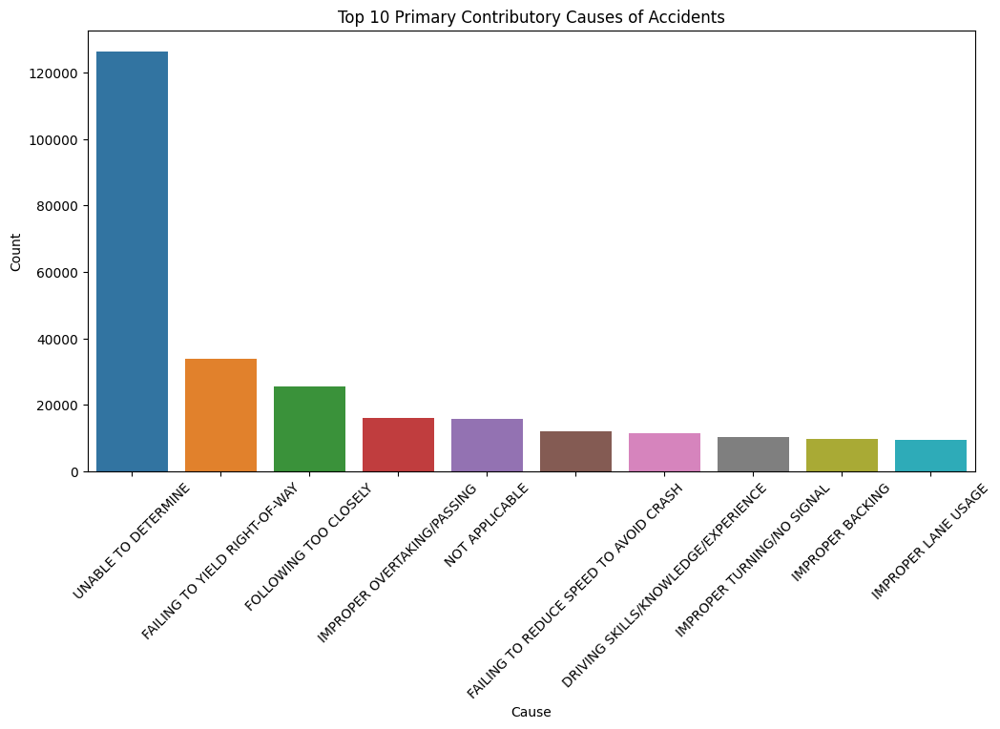

In [10]:
cause_counts = crashes['prim_contributory_cause'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=cause_counts.head(10).index, y=cause_counts.head(10).values)
plt.xticks(rotation=45)
plt.title('Top 10 Primary Contributory Causes of Accidents')
plt.xlabel('Cause')
plt.ylabel('Count')
plt.show()


## Severity of Accidents Over Time

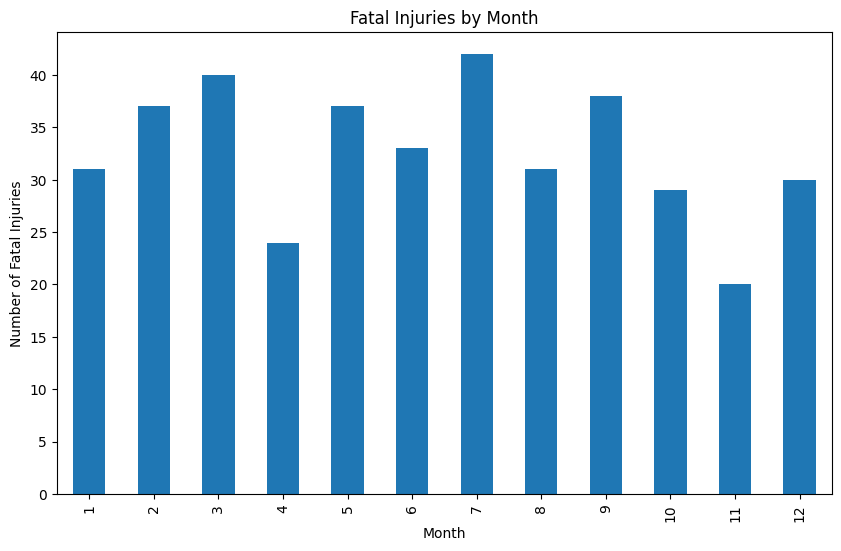

In [11]:
crashes['crash_month'] = crashes['crash_date'].dt.month
severity = crashes.groupby('crash_month')['injuries_fatal'].sum()
severity.plot(kind='bar', figsize=(10, 6))
plt.title('Fatal Injuries by Month')
plt.xlabel('Month')
plt.ylabel('Number of Fatal Injuries')
plt.show()


## Age and Injury Analysis

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

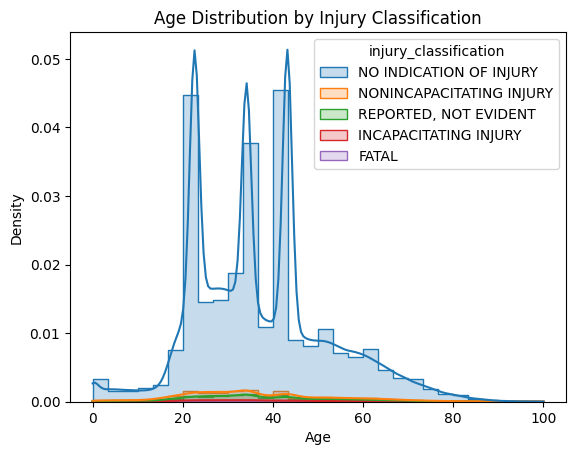

In [12]:
sns.histplot(data=people, x='age', hue='injury_classification', kde=True, bins=30, element="step", stat="density")
plt.title('Age Distribution by Injury Classification')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

## Vehicle Types and Their Involvement in Crashes

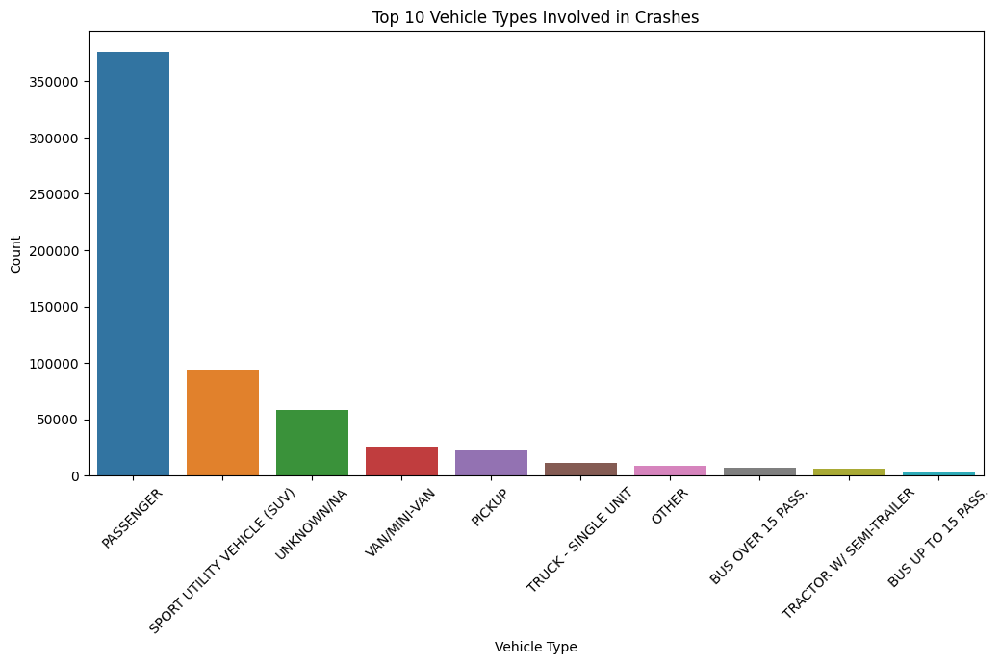

In [13]:
vehicle_counts = vehicles['vehicle_type'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=vehicle_counts.head(10).index, y=vehicle_counts.head(10).values)
plt.xticks(rotation=45)
plt.title('Top 10 Vehicle Types Involved in Crashes')
plt.xlabel('Vehicle Type')
plt.ylabel('Count')
plt.show()

## Geographic Distribution of Crashes

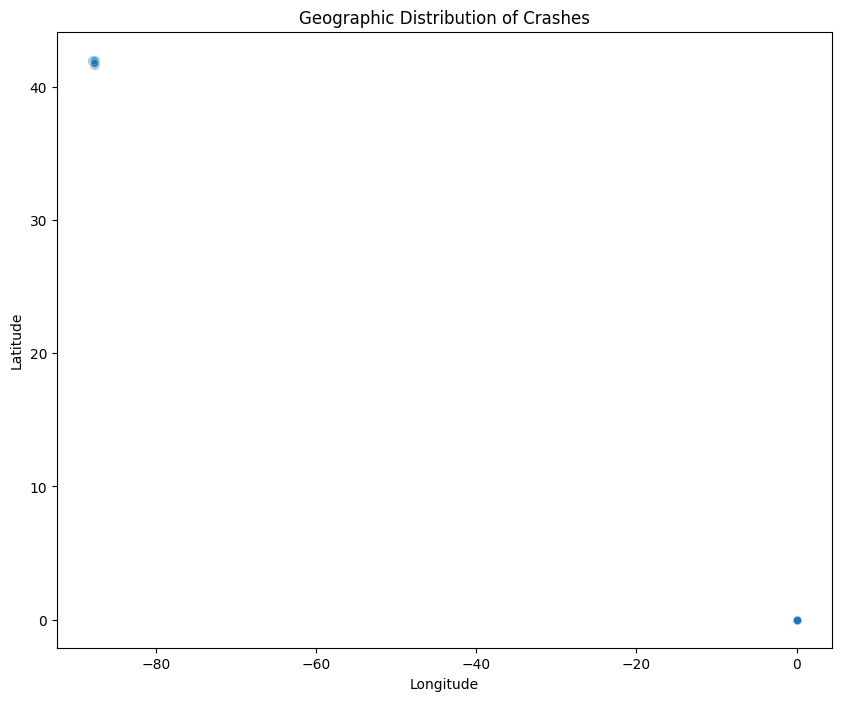

In [14]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=crashes, alpha=0.3)
plt.title('Geographic Distribution of Crashes')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

## Correlation Analysis

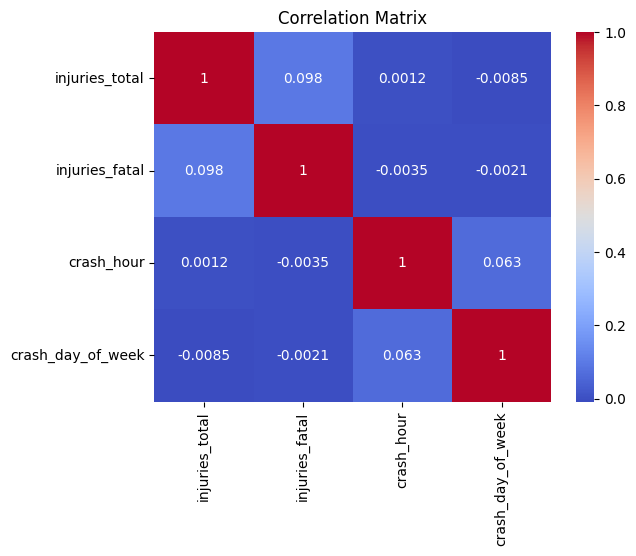

In [15]:
corr_matrix = crashes[['injuries_total', 'injuries_fatal', 'crash_hour', 'crash_day_of_week']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


## Demographics of Crash Victims

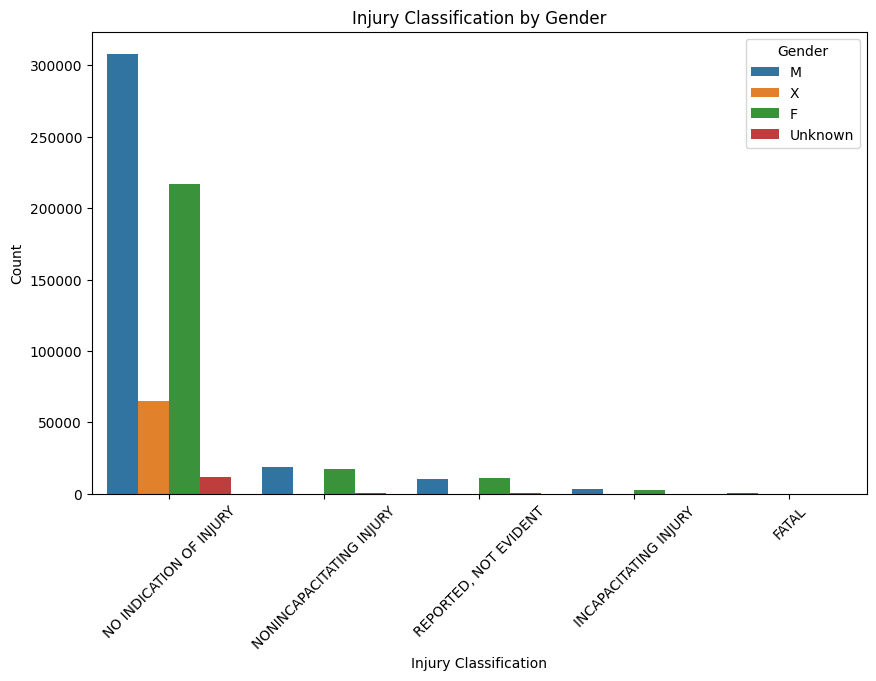

In [16]:
plt.figure(figsize=(10, 6))
sns.countplot(data=people, x='injury_classification', hue='sex', order=people['injury_classification'].value_counts().index)
plt.title('Injury Classification by Gender')
plt.xlabel('Injury Classification')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.xticks(rotation=45)
plt.show()



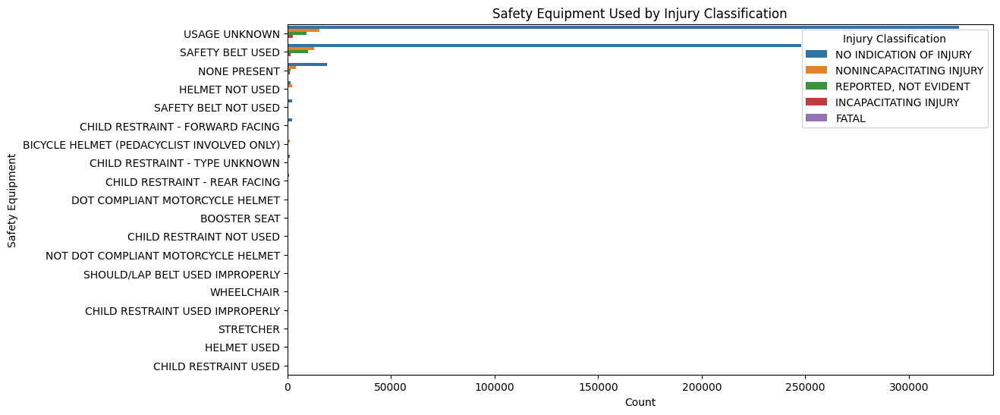

In [17]:
# Injury Classification by Safety Equipment
plt.figure(figsize=(12, 6))
sns.countplot(data=people, y='safety_equipment', hue='injury_classification', order=people['safety_equipment'].value_counts().index)
plt.title('Safety Equipment Used by Injury Classification')
plt.xlabel('Count')
plt.ylabel('Safety Equipment')
plt.legend(title='Injury Classification')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


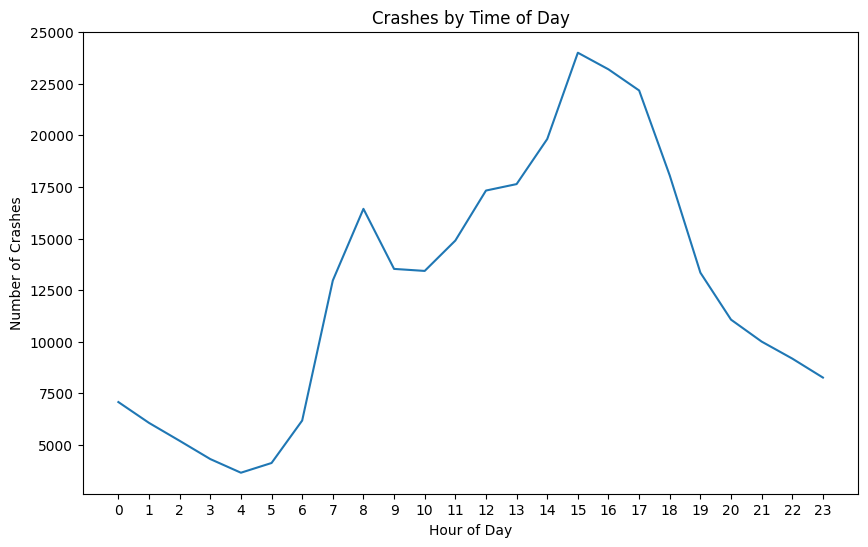

In [18]:
# Crashes by Time of Day
hourly_crashes = crashes['crash_hour'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
sns.lineplot(x=hourly_crashes.index, y=hourly_crashes.values)
plt.title('Crashes by Time of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Crashes')
plt.xticks(range(0, 24))
plt.show()

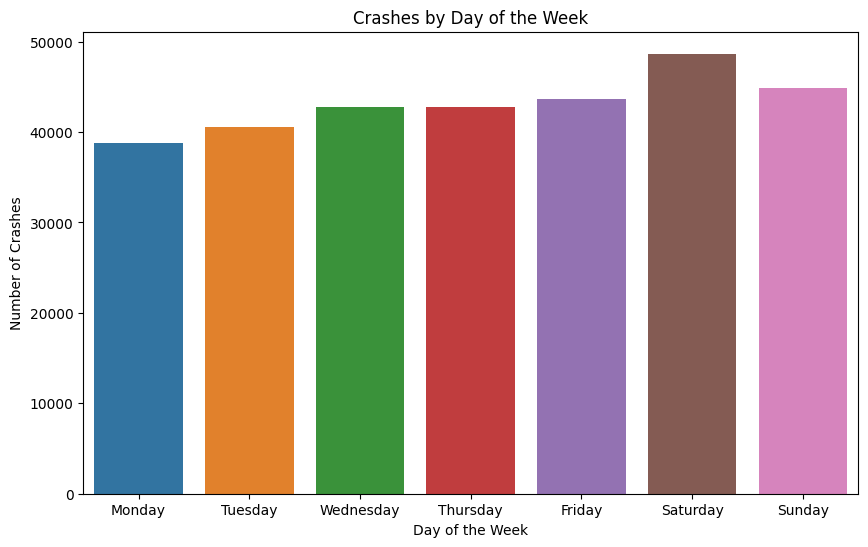

In [19]:
# Crashes by Day of the Week
day_of_week_mapping = {1: 'Monday', 2: 'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday', 7: 'Sunday'}
crashes['crash_day_of_week'] = crashes['crash_day_of_week'].map(day_of_week_mapping)
weekday_crashes = crashes['crash_day_of_week'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=weekday_crashes.index, y=weekday_crashes.values, order=day_of_week_mapping.values())
plt.title('Crashes by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crashes')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


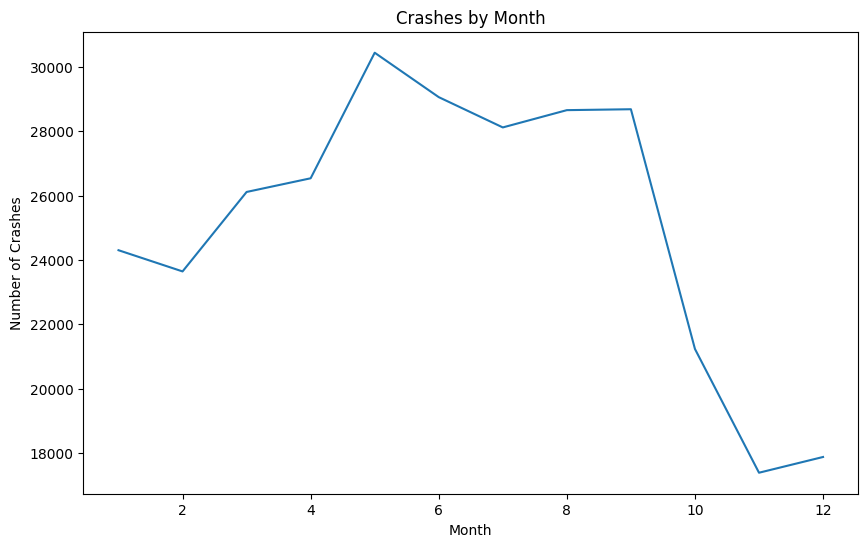

In [20]:
# Crashes by Month
monthly_crashes = crashes['crash_month'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
sns.lineplot(x=monthly_crashes.index, y=monthly_crashes.values)
plt.title('Crashes by Month')
plt.xlabel('Month')
plt.ylabel('Number of Crashes')
plt.show()

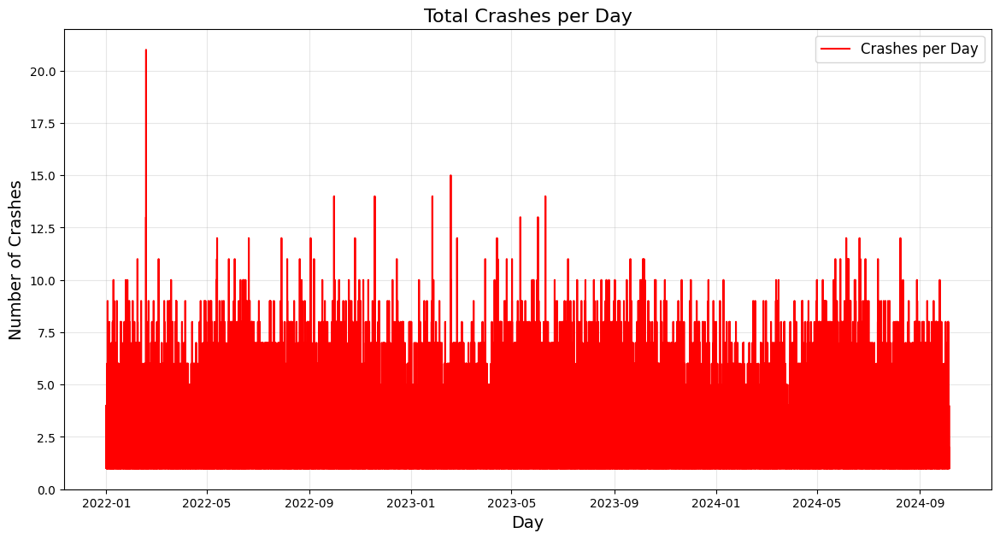

In [21]:
daily_crashes = crashes.groupby('crash_date').size()

# Plot the data
plt.figure(figsize=(14, 7))
plt.plot(daily_crashes.index, daily_crashes.values, color='red', label='Crashes per Day')
plt.title('Total Crashes per Day', fontsize=16)
plt.xlabel('Day', fontsize=14)
plt.ylabel('Number of Crashes', fontsize=14)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.show()

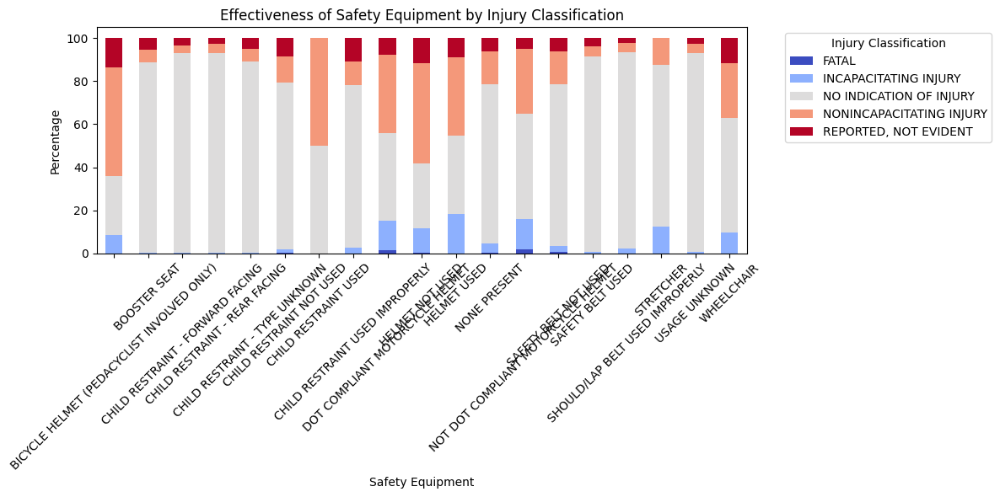

In [22]:
# Cross-tabulation of Safety Equipment and Injury Classification
safety_effectiveness = pd.crosstab(people['safety_equipment'], people['injury_classification'], normalize='index') * 100
safety_effectiveness.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='coolwarm')
plt.title('Effectiveness of Safety Equipment by Injury Classification')
plt.xlabel('Safety Equipment')
plt.ylabel('Percentage')
plt.legend(title='Injury Classification', bbox_to_anchor=(1.05, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [23]:
crashes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302020 entries, 0 to 302019
Data columns (total 25 columns):
 #   Column                   Non-Null Count   Dtype              
---  ------                   --------------   -----              
 0   crash_record_id          302020 non-null  object             
 1   crash_date               302020 non-null  datetime64[ns, UTC]
 2   posted_speed_limit       302020 non-null  int64              
 3   traffic_control_device   302020 non-null  object             
 4   device_condition         302020 non-null  object             
 5   weather_condition        302020 non-null  object             
 6   lighting_condition       302020 non-null  object             
 7   first_crash_type         302020 non-null  object             
 8   trafficway_type          302020 non-null  object             
 9   alignment                302020 non-null  object             
 10  roadway_surface_cond     302020 non-null  object             
 11  road_defect  

## Relationship Between Weather Conditions and Crash Severity

<Figure size 1400x700 with 0 Axes>

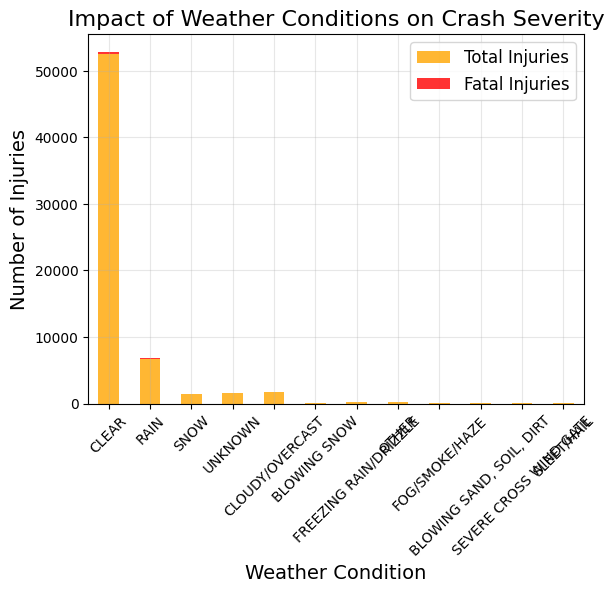

In [24]:


# Group crashes by weather condition and severity
weather_severity = crashes.groupby('weather_condition')[['injuries_total', 'injuries_fatal']].sum()

# Sort data for visualization
weather_severity = weather_severity.sort_values('injuries_fatal', ascending=False)

# Plot
plt.figure(figsize=(14, 7))
weather_severity.plot(kind='bar', stacked=True, color=['orange', 'red'], alpha=0.8)
plt.title('Impact of Weather Conditions on Crash Severity', fontsize=16)
plt.xlabel('Weather Condition', fontsize=14)
plt.ylabel('Number of Injuries', fontsize=14)
plt.legend(['Total Injuries', 'Fatal Injuries'], loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.xticks(rotation=45)
plt.show()



## Crash Trends Over Time by Weather Condition

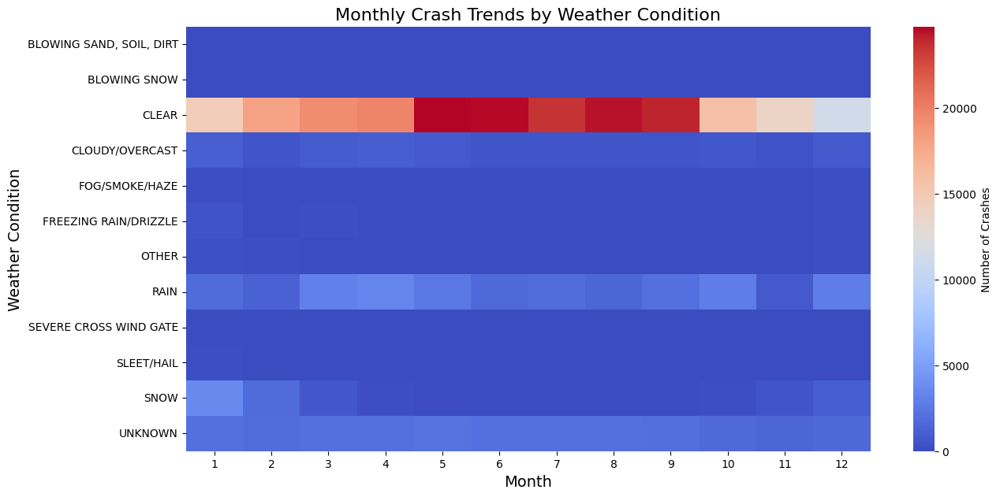

In [25]:
weather_monthly = crashes.groupby(['weather_condition', 'crash_month']).size().unstack(fill_value=0)

# Plot
plt.figure(figsize=(14, 7))
sns.heatmap(weather_monthly, cmap='coolwarm', annot=False, cbar_kws={'label': 'Number of Crashes'})
plt.title('Monthly Crash Trends by Weather Condition', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Weather Condition', fontsize=14)
plt.show()

## Vehicle Types and Weather Impact

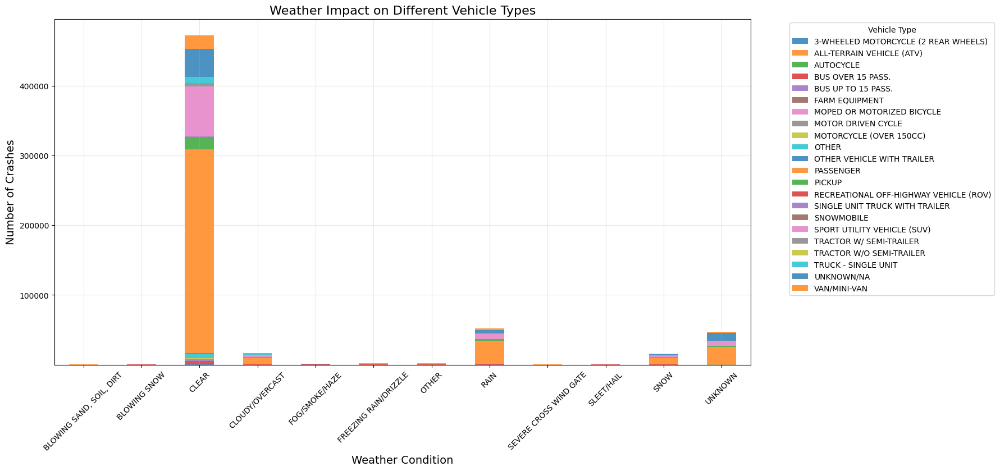

In [26]:
crashes_vehicles = crashes.merge(vehicles, on='crash_record_id')

# Group by weather condition and vehicle type
vehicle_weather = crashes_vehicles.groupby(['weather_condition', 'vehicle_type']).size().unstack(fill_value=0)

# Plot
vehicle_weather.plot(kind='bar', stacked=True, figsize=(16, 8), alpha=0.8)
plt.title('Weather Impact on Different Vehicle Types', fontsize=16)
plt.xlabel('Weather Condition', fontsize=14)
plt.ylabel('Number of Crashes', fontsize=14)
plt.legend(title='Vehicle Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()


## Injury Types and Weather Correlation

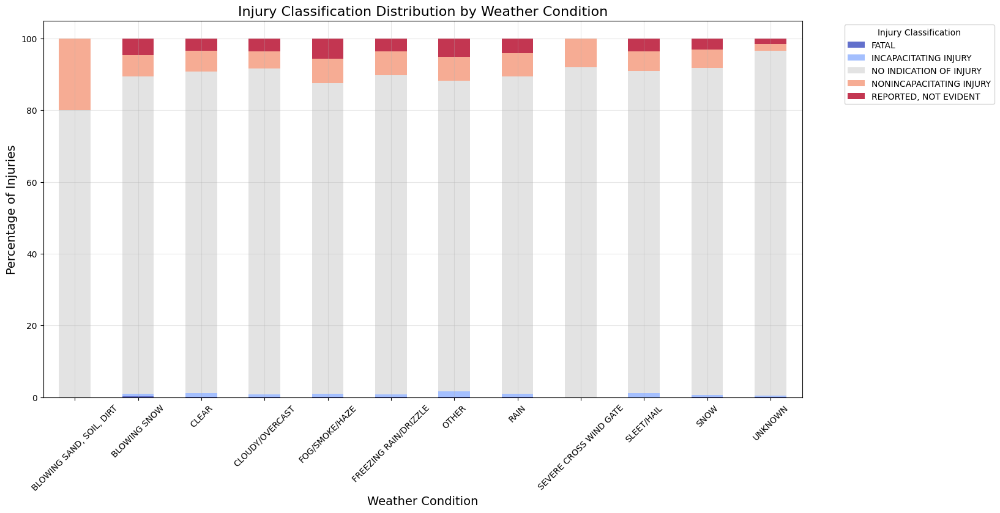

In [27]:
crashes_people = crashes.merge(people, on='crash_record_id')

# Group by weather condition and injury classification
injury_weather = crashes_people.groupby(['weather_condition', 'injury_classification']).size().unstack(fill_value=0)

# Normalize data to percentages
injury_weather_percentage = injury_weather.div(injury_weather.sum(axis=1), axis=0) * 100

# Plot
injury_weather_percentage.plot(kind='bar', stacked=True, figsize=(16, 8), alpha=0.8, colormap='coolwarm')
plt.title('Injury Classification Distribution by Weather Condition', fontsize=16)
plt.xlabel('Weather Condition', fontsize=14)
plt.ylabel('Percentage of Injuries', fontsize=14)
plt.legend(title='Injury Classification', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()

## 

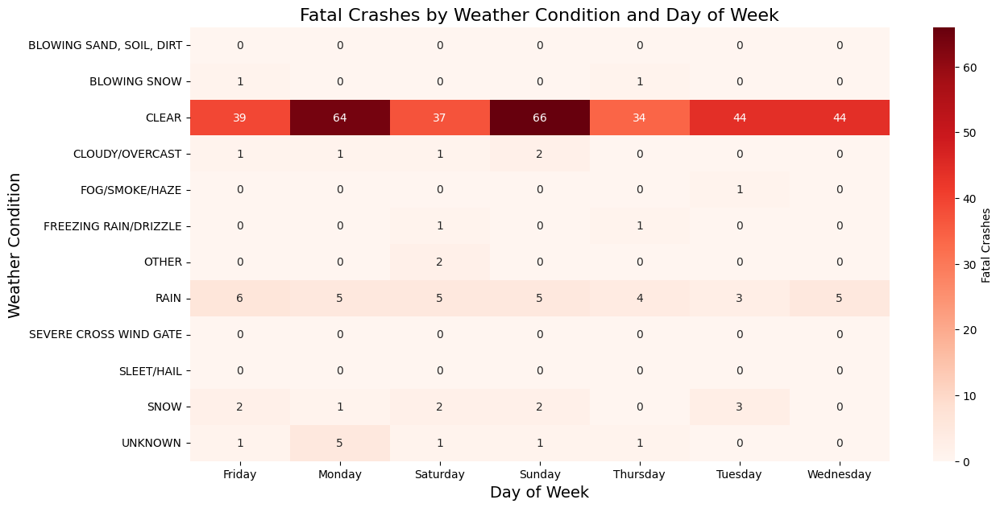

In [28]:
# Group by weather condition and day of the week
fatal_crashes = crashes.groupby(['weather_condition', 'crash_day_of_week'])['injuries_fatal'].sum().unstack(fill_value=0)

# Plot heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(fatal_crashes, cmap='Reds', annot=True, fmt='.0f', cbar_kws={'label': 'Fatal Crashes'})
plt.title('Fatal Crashes by Weather Condition and Day of Week', fontsize=16)
plt.xlabel('Day of Week', fontsize=14)
plt.ylabel('Weather Condition', fontsize=14)
plt.show()


In [29]:
import folium
from folium.plugins import HeatMap
from sklearn.cluster import DBSCAN

# Ensure crash_date is datetime and filter necessary columns
crashes['crash_date'] = pd.to_datetime(crashes['crash_date'])
crash_data = crashes[['latitude', 'longitude']].dropna()

# Use DBSCAN for clustering
dbscan = DBSCAN(eps=0.01, min_samples=20)  # eps and min_samples can be adjusted
crash_data['cluster'] = dbscan.fit_predict(crash_data[['latitude', 'longitude']])

# Count crashes per cluster
cluster_counts = crash_data['cluster'].value_counts()
top_clusters = cluster_counts[cluster_counts.index != -1].head(10)  # Ignore noise (-1)

# Create a base map
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Plot clusters on the map
for cluster_id, count in top_clusters.items():
    cluster_data = crash_data[crash_data['cluster'] == cluster_id]
    heat_data = cluster_data[['latitude', 'longitude']].values.tolist()
    HeatMap(heat_data, radius=15, blur=10, max_zoom=13).add_to(chicago_map)

# Save the map to an HTML file or display it
chicago_map.save('chicago_crash_clusters.html')  # Save as HTML
chicago_map  # Display in Jupyter Notebook

## Roadway Surface Condition and Injury Severity

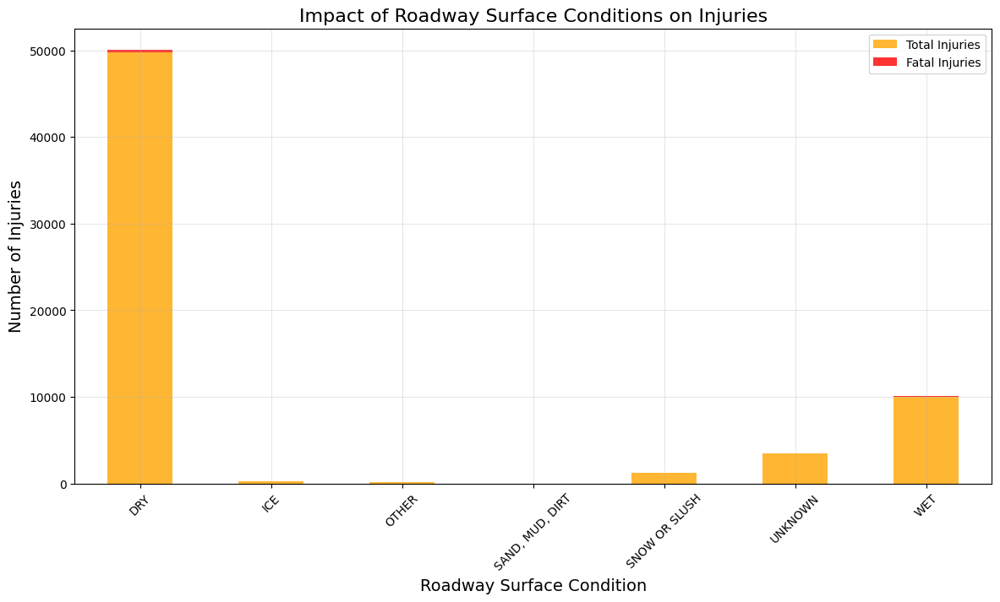

In [30]:
# Group injuries by roadway surface condition
surface_injuries = crashes.groupby('roadway_surface_cond')[['injuries_total', 'injuries_fatal']].sum()

# Plot injuries (stacked bar)
surface_injuries.plot(kind='bar', stacked=True, figsize=(14, 7), color=['orange', 'red'], alpha=0.8)
plt.title('Impact of Roadway Surface Conditions on Injuries', fontsize=16)
plt.xlabel('Roadway Surface Condition', fontsize=14)
plt.ylabel('Number of Injuries', fontsize=14)
plt.legend(['Total Injuries', 'Fatal Injuries'], loc='upper right')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()


## Road Defect Analysis

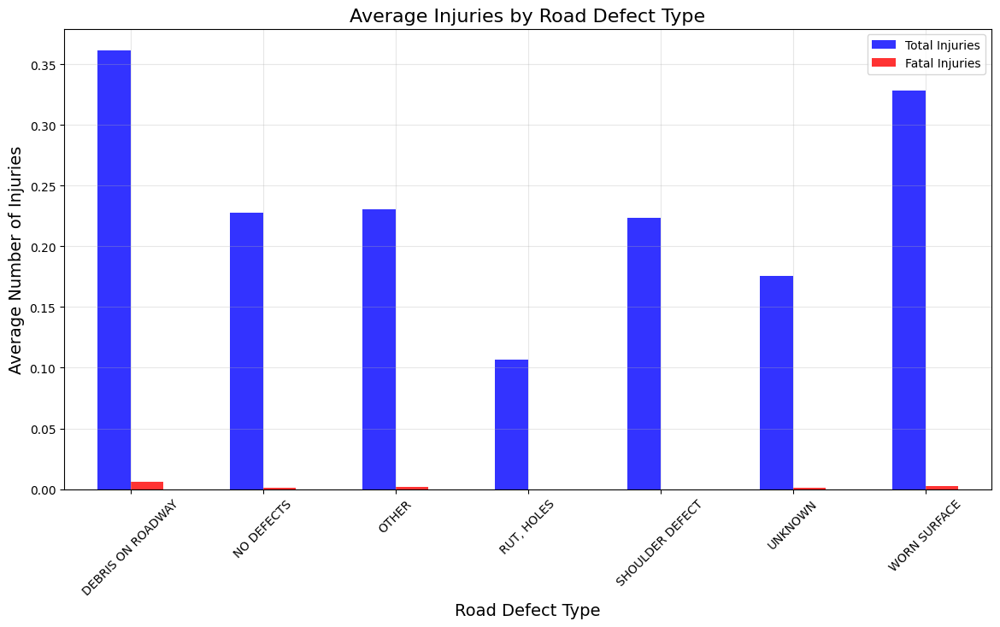

In [31]:
# Group by road defect and calculate mean injuries
road_defect_analysis = crashes.groupby('road_defect')[['injuries_total', 'injuries_fatal']].mean()

# Plot bar chart
road_defect_analysis.plot(kind='bar', figsize=(14, 7), color=['blue', 'red'], alpha=0.8)
plt.title('Average Injuries by Road Defect Type', fontsize=16)
plt.xlabel('Road Defect Type', fontsize=14)
plt.ylabel('Average Number of Injuries', fontsize=14)
plt.legend(['Total Injuries', 'Fatal Injuries'], loc='upper right')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()


## Damage Levels and Crash Severity

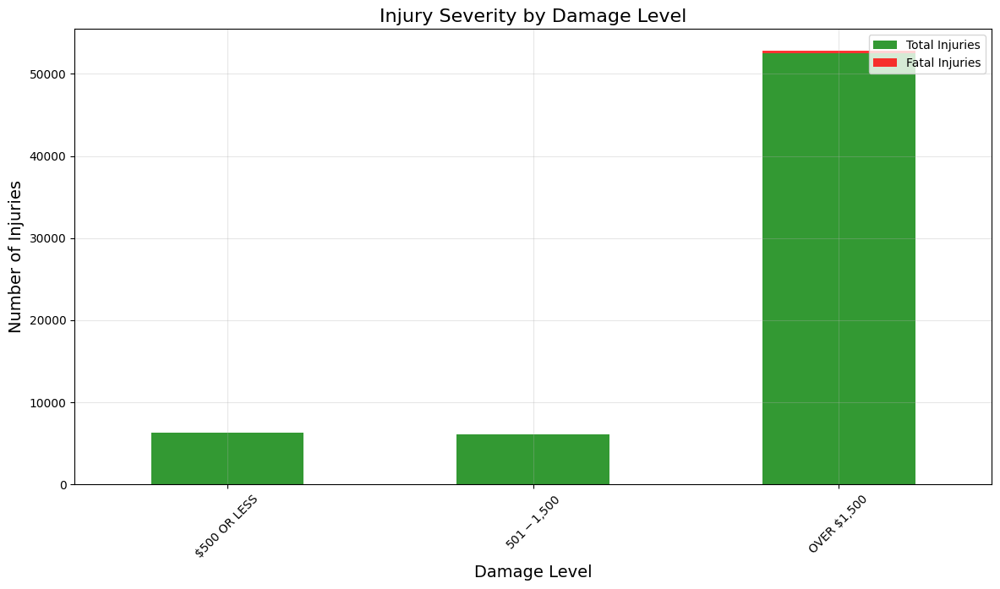

In [32]:
# Group by damage and calculate total injuries
damage_analysis = crashes.groupby('damage')[['injuries_total', 'injuries_fatal']].sum()

# Plot stacked bar chart
damage_analysis.plot(kind='bar', stacked=True, figsize=(14, 7), color=['green', 'red'], alpha=0.8)
plt.title('Injury Severity by Damage Level', fontsize=16)
plt.xlabel('Damage Level', fontsize=14)
plt.ylabel('Number of Injuries', fontsize=14)
plt.legend(['Total Injuries', 'Fatal Injuries'], loc='upper right')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()

## Most Severe Injury Distribution

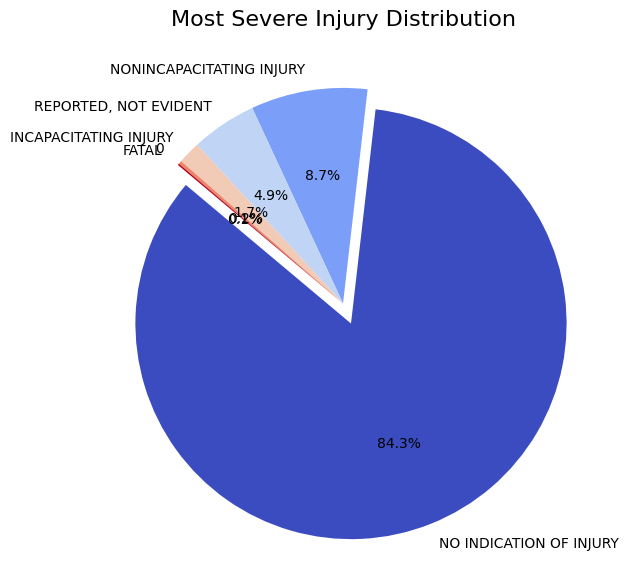

In [33]:
# Count most severe injuries
severe_injury_count = crashes['most_severe_injury'].value_counts()

# Plot pie chart
severe_injury_count.plot(kind='pie', figsize=(10, 7), autopct='%1.1f%%', startangle=140, colormap='coolwarm', explode=[0.1 if i == 0 else 0 for i in range(len(severe_injury_count))])
plt.title('Most Severe Injury Distribution', fontsize=16)
plt.ylabel('')  # Remove y-axis label for clarity
plt.show()

## Combined Analysis: Surface Condition and Most Severe Injury

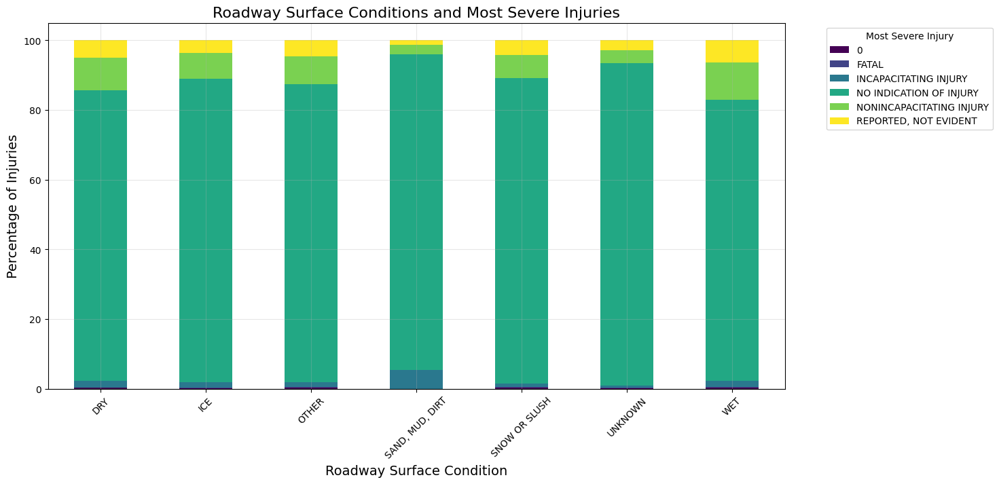

In [34]:
# Cross-tabulation of surface condition and severe injury
surface_injury = pd.crosstab(crashes['roadway_surface_cond'], crashes['most_severe_injury'])

# Normalize by row to get percentages
surface_injury_percentage = surface_injury.div(surface_injury.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
surface_injury_percentage.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis')
plt.title('Roadway Surface Conditions and Most Severe Injuries', fontsize=16)
plt.xlabel('Roadway Surface Condition', fontsize=14)
plt.ylabel('Percentage of Injuries', fontsize=14)
plt.legend(title='Most Severe Injury', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()


## Heatmap of Factors Influencing Fatal Injuries

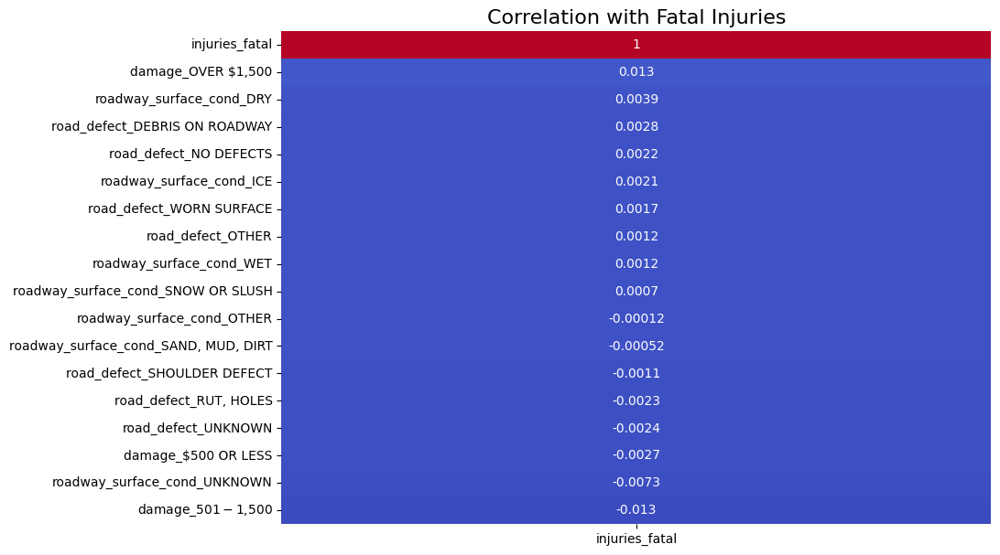

In [35]:
# Encode categorical features for correlation analysis
crashes_encoded = crashes[['roadway_surface_cond', 'road_defect', 'damage', 'injuries_fatal']].copy()
crashes_encoded = pd.get_dummies(crashes_encoded, columns=['roadway_surface_cond', 'road_defect', 'damage'])

# Compute correlation matrix
correlation_matrix = crashes_encoded.corr()

# Filter correlations with injuries_fatal
fatal_corr = correlation_matrix['injuries_fatal'].sort_values(ascending=False)

# Plot heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(fatal_corr.to_frame(), annot=True, cmap='coolwarm', cbar=False)
plt.title('Correlation with Fatal Injuries', fontsize=16)
plt.show()

## Time-Series Analysis of Fatal Injuries

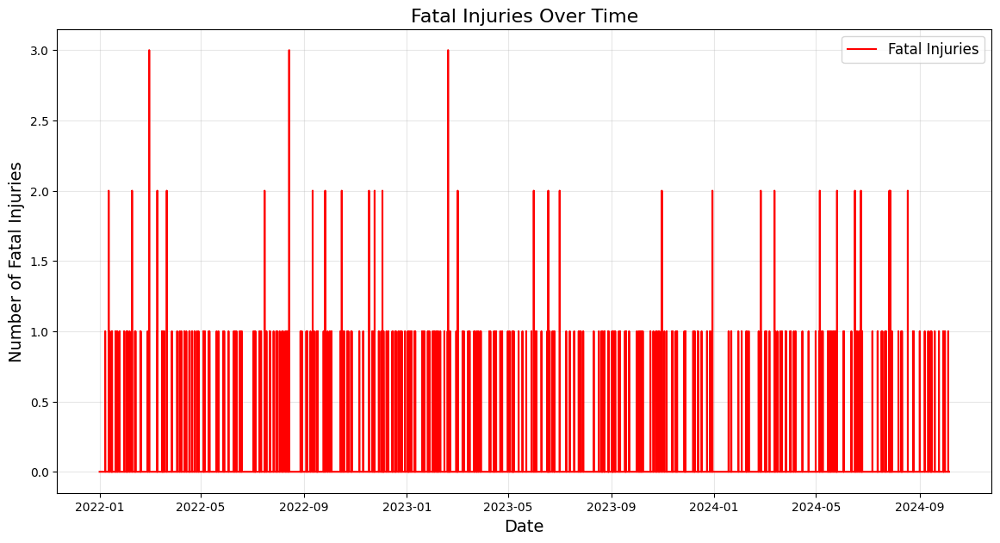

In [36]:
# Group by crash date and sum fatal injuries
fatal_injuries_time = crashes.groupby('crash_date')['injuries_fatal'].sum()

# Plot time-series
plt.figure(figsize=(14, 7))
plt.plot(fatal_injuries_time.index, fatal_injuries_time.values, color='red', label='Fatal Injuries')
plt.title('Fatal Injuries Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Fatal Injuries', fontsize=14)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


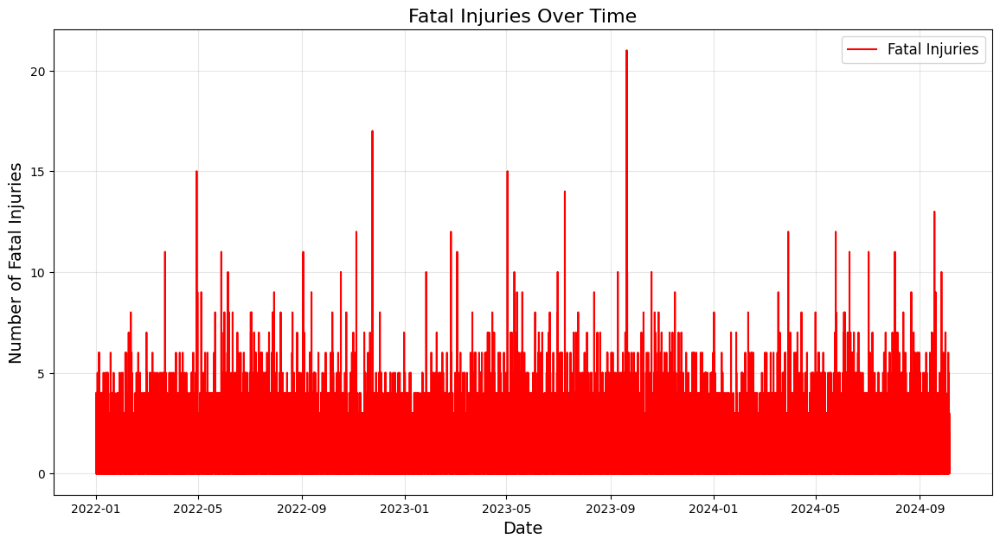

In [37]:
# Group by crash date and sum total injuries
total_injuries_time = crashes.groupby('crash_date')['injuries_total'].sum()

# Plot time-series
plt.figure(figsize=(14, 7))
plt.plot(total_injuries_time.index, total_injuries_time.values, color='red', label='Fatal Injuries')
plt.title('Fatal Injuries Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Fatal Injuries', fontsize=14)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


## Clustering High-Injury Areas

In [38]:
# Filter crashes with injuries
high_injury_crashes = crashes[crashes['injuries_total'] > 0][['latitude', 'longitude', 'injuries_total']].dropna()

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.0008, min_samples=15)
high_injury_crashes['cluster'] = dbscan.fit_predict(high_injury_crashes[['latitude', 'longitude']])

# Filter out noise points
clustered_data = high_injury_crashes[high_injury_crashes['cluster'] != -1]

# Plot heatmap of injury clusters
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)
heat_data = clustered_data[['latitude', 'longitude']].values.tolist()
HeatMap(heat_data, radius=10, blur=5).add_to(chicago_map)

# Save or display map
chicago_map


In [39]:
high_injury_crashes.head(10)

,latitude,longitude,injuries_total,cluster
4,41.758246,-87.626522,5.0,0
12,41.910530,-87.667051,2.0,203
23,41.830595,-87.665424,5.0,1
28,41.923911,-87.777386,1.0,-1
29,41.771533,-87.644717,1.0,184
32,41.866119,-87.720928,1.0,2
33,41.912793,-87.633658,1.0,3
50,41.923525,-87.663670,1.0,-1
56,41.749913,-87.634585,2.0,456
73,41.744152,-87.585945,1.0,4


In [40]:
crashes.columns

Index(['crash_record_id', 'crash_date', 'posted_speed_limit',
       'traffic_control_device', 'device_condition', 'weather_condition',
       'lighting_condition', 'first_crash_type', 'trafficway_type',
       'alignment', 'roadway_surface_cond', 'road_defect', 'crash_type',
       'damage', 'prim_contributory_cause', 'sec_contributory_cause',
       'num_units', 'most_severe_injury', 'injuries_total', 'injuries_fatal',
       'crash_hour', 'crash_day_of_week', 'crash_month', 'latitude',
       'longitude'],
      dtype='object')

# (Consider) total injuries based on location

In [41]:
high_injury_crashes = crashes[crashes['injuries_total'] > 0][['latitude', 'longitude', 'injuries_total']].dropna()

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.001, min_samples=27)
high_injury_crashes['cluster'] = dbscan.fit_predict(high_injury_crashes[['latitude', 'longitude']])

# Filter out noise points
clustered_data = high_injury_crashes[high_injury_crashes['cluster'] != -1]

# Aggregate data by cluster for circle marker sizing
cluster_summary = clustered_data.groupby('cluster').agg({
    'latitude': 'mean',
    'longitude': 'mean',
    'injuries_total': 'sum'
}).reset_index()

# Create a base map centered on Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Add circle markers to the map
for _, row in cluster_summary.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['injuries_total'] / 10,  # Scale the radius based on total injuries
        color='blue',
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"Cluster ID: {row['cluster']}<br>Total Injuries: {row['injuries_total']}"
    ).add_to(chicago_map)

# Save or display the map
chicago_map.save('chicago_cluster_circle_markers.html')
chicago_map

total fatal injuries based on location

In [42]:
# Include a crash count to calculate average injuries per accident
clustered_data.loc[:,'accident_count'] = 1  # Each row represents one accident

# Aggregate data by cluster for metrics
cluster_summary = clustered_data.groupby('cluster').agg({
    'latitude': 'mean',
    'longitude': 'mean',
    'injuries_total': 'sum',
    'accident_count': 'count'  # Total accidents in the cluster
}).reset_index()

# Add average injuries per accident
cluster_summary['avg_injuries_per_accident'] = cluster_summary['injuries_total'] / cluster_summary['accident_count']

# Create a base map centered on Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Add circle markers to the map
for _, row in cluster_summary.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['injuries_total'] / 10,  # Scale radius by total injuries
        color='blue',
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=(
            f"Cluster ID: {row['cluster']}<br>"
            f"Total Injuries: {row['injuries_total']}<br>"
            f"Total Accidents: {row['accident_count']}<br>"
            f"Average Injuries per Accident: {row['avg_injuries_per_accident']:.2f}"
        )
    ).add_to(chicago_map)

# Save or display the map
chicago_map.save('chicago_avg_injuries_per_accident.html')
chicago_map

/tmp/ipykernel_17/4240650728.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clustered_data.loc[:,'accident_count'] = 1  # Each row represents one accident


## total accidents based on location

In [43]:
total_crashes = crashes[['latitude', 'longitude']].dropna()

# Add a count column to represent each crash as 1 (to sum later)
total_crashes['accident_count'] = 1

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.001, min_samples=30)
total_crashes['cluster'] = dbscan.fit_predict(total_crashes[['latitude', 'longitude']])

# Filter out noise points (cluster = -1)
clustered_data = total_crashes[total_crashes['cluster'] != -1]

# Aggregate data by cluster for circle marker sizing
cluster_summary = clustered_data.groupby('cluster').agg({
    'latitude': 'mean',
    'longitude': 'mean',
    'accident_count': 'sum'  # Total number of crashes in the cluster
}).reset_index()

# Create a base map centered on Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Add circle markers to the map
for _, row in cluster_summary.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['accident_count'] / 500,  # Scale the radius based on total accidents
        color='blue',
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"Cluster ID: {row['cluster']}<br>Total Accidents: {row['accident_count']}"
    ).add_to(chicago_map)

# Save or display the map
chicago_map.save('chicago_total_accident_clusters.html')
chicago_map

## Driver Action and Crash Outcomes

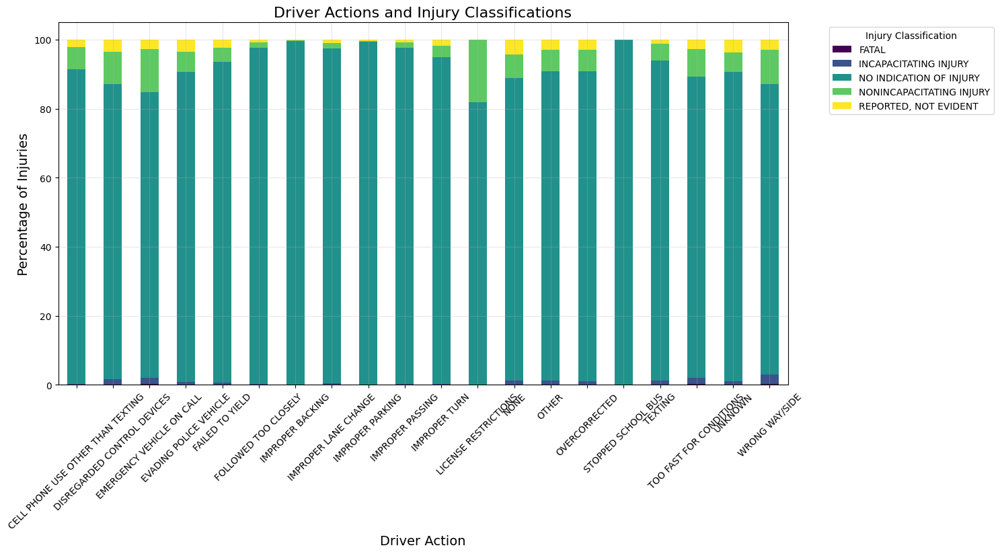

In [44]:
# Cross-tabulation of driver action and injury classification
driver_injury = pd.crosstab(people['driver_action'], people['injury_classification'])

# Normalize for percentages
driver_injury_percentage = driver_injury.div(driver_injury.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
driver_injury_percentage.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis')
plt.title('Driver Actions and Injury Classifications', fontsize=16)
plt.xlabel('Driver Action', fontsize=14)
plt.ylabel('Percentage of Injuries', fontsize=14)
plt.legend(title='Injury Classification', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()

## Crash Time Analysis: Severity by Hour

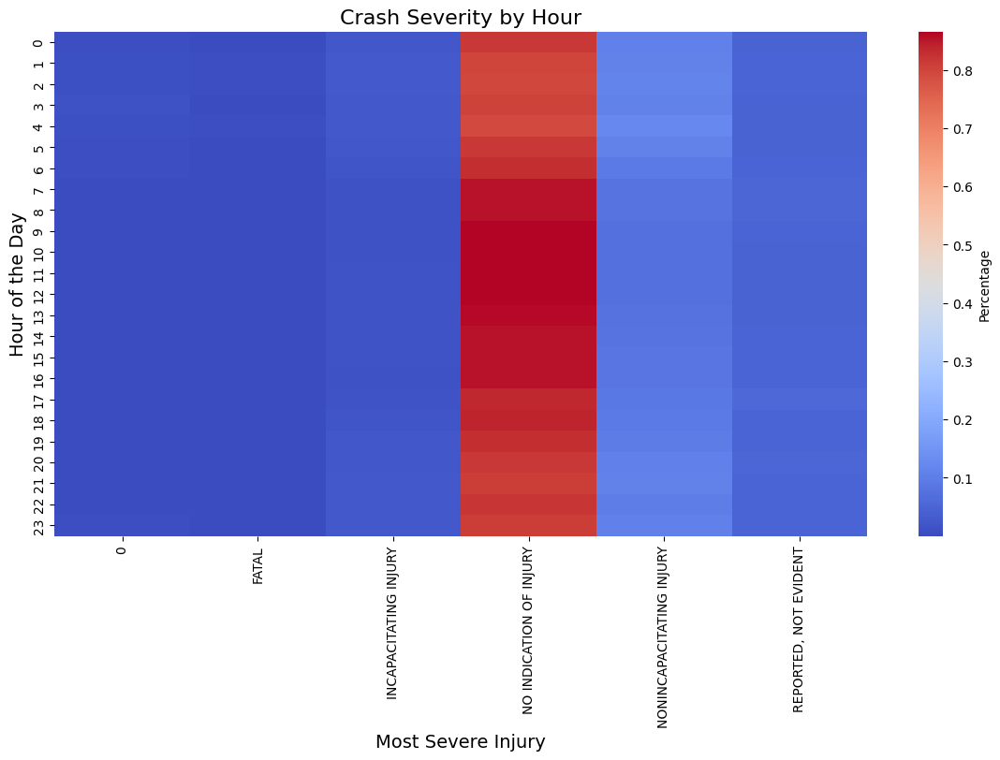

In [45]:
# Group by crash hour and injury severity
hourly_severity = crashes.groupby(['crash_hour', 'most_severe_injury']).size().unstack(fill_value=0)

# Normalize to percentages
hourly_severity_percentage = hourly_severity.div(hourly_severity.sum(axis=1), axis=0)

# Plot heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(hourly_severity_percentage, cmap='coolwarm', annot=False, cbar_kws={'label': 'Percentage'})
plt.title('Crash Severity by Hour', fontsize=16)
plt.xlabel('Most Severe Injury', fontsize=14)
plt.ylabel('Hour of the Day', fontsize=14)
plt.show()


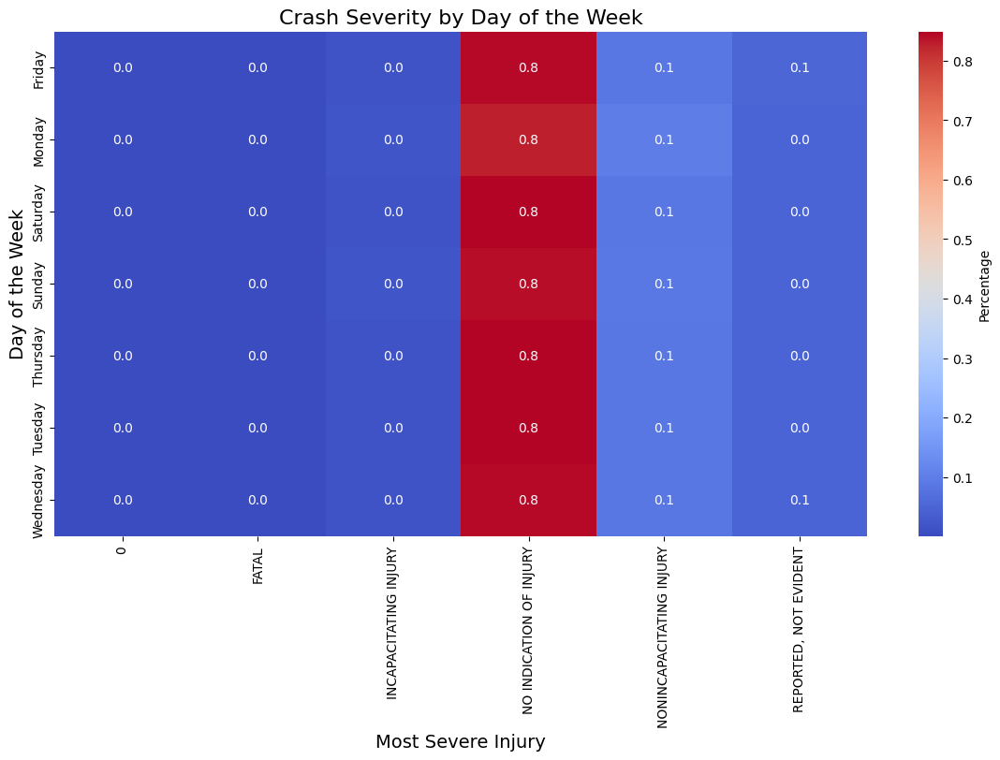

In [46]:
# Group by day of the week and injury severity
weekly_severity = crashes.groupby(['crash_day_of_week', 'most_severe_injury']).size().unstack(fill_value=0)

# Normalize to percentages
weekly_severity_percentage = weekly_severity.div(weekly_severity.sum(axis=1), axis=0)

# Plot heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(weekly_severity_percentage, cmap='coolwarm', annot=True, fmt='.1f', cbar_kws={'label': 'Percentage'})
plt.title('Crash Severity by Day of the Week', fontsize=16)
plt.xlabel('Most Severe Injury', fontsize=14)
plt.ylabel('Day of the Week', fontsize=14)
plt.show()


## Vehicle Occupancy and Crash Severity

## Primary Cause of Crashes

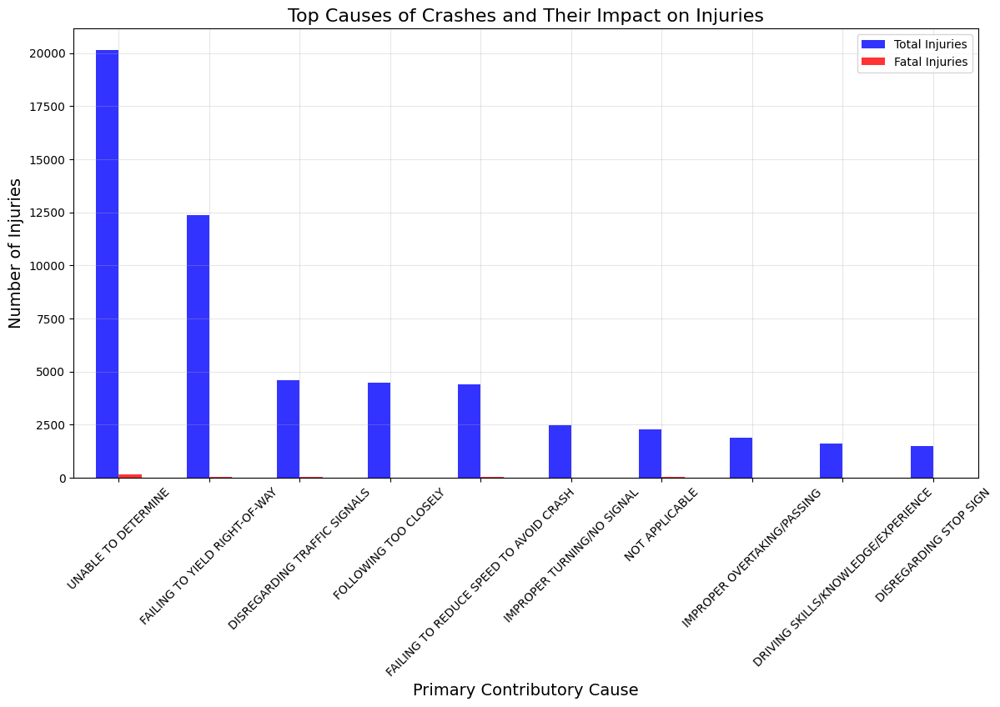

In [47]:
# Group by primary cause and calculate total and fatal injuries
primary_cause_analysis = crashes.groupby('prim_contributory_cause')[['injuries_total', 'injuries_fatal']].sum()

# Filter top causes by total injuries
primary_cause_analysis = primary_cause_analysis.sort_values('injuries_total', ascending=False).head(10)

# Plot bar chart
primary_cause_analysis.plot(kind='bar', figsize=(14, 7), color=['blue', 'red'], alpha=0.8)
plt.title('Top Causes of Crashes and Their Impact on Injuries', fontsize=16)
plt.xlabel('Primary Contributory Cause', fontsize=14)
plt.ylabel('Number of Injuries', fontsize=14)
plt.legend(['Total Injuries', 'Fatal Injuries'], loc='upper right')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()


# (Consider) Traffic Control Devices and Crash Severity

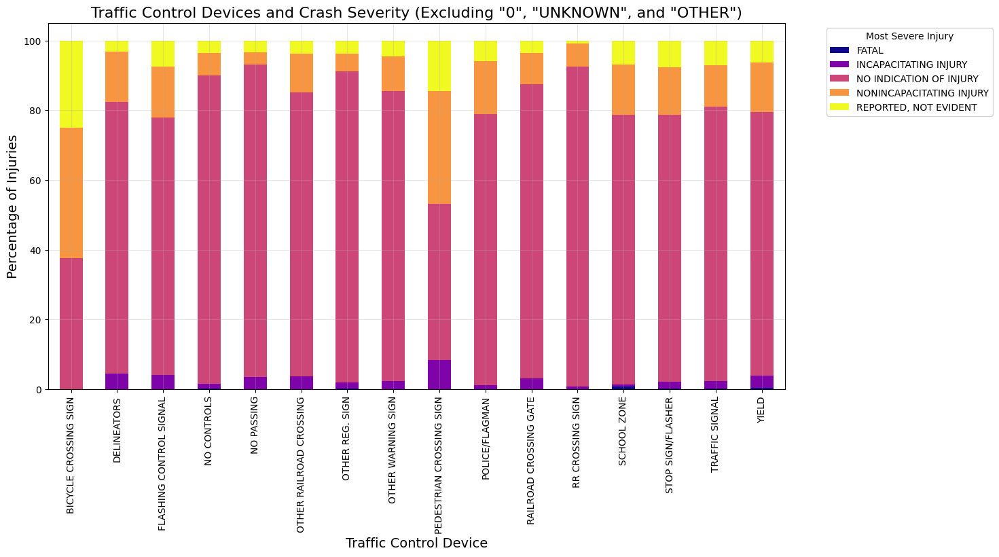

In [48]:
# Filter out 'UNKNOWN' and 'OTHER' from traffic_control_device
filtered_crashes = crashes[~crashes['traffic_control_device'].isin(['UNKNOWN', 'OTHER'])]

# Filter out '0' from most_severe_injury
filtered_crashes = filtered_crashes[filtered_crashes['most_severe_injury'] != '0']

# Cross-tabulation of traffic control devices and injury classification
device_injury = pd.crosstab(filtered_crashes['traffic_control_device'], filtered_crashes['most_severe_injury'])

# Normalize for percentages
device_injury_percentage = device_injury.div(device_injury.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
device_injury_percentage.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='plasma')
plt.title('Traffic Control Devices and Crash Severity (Excluding "0", "UNKNOWN", and "OTHER")', fontsize=16)
plt.xlabel('Traffic Control Device', fontsize=14)
plt.ylabel('Percentage of Injuries', fontsize=14)
plt.legend(title='Most Severe Injury', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.grid(alpha=0.3)
plt.show()

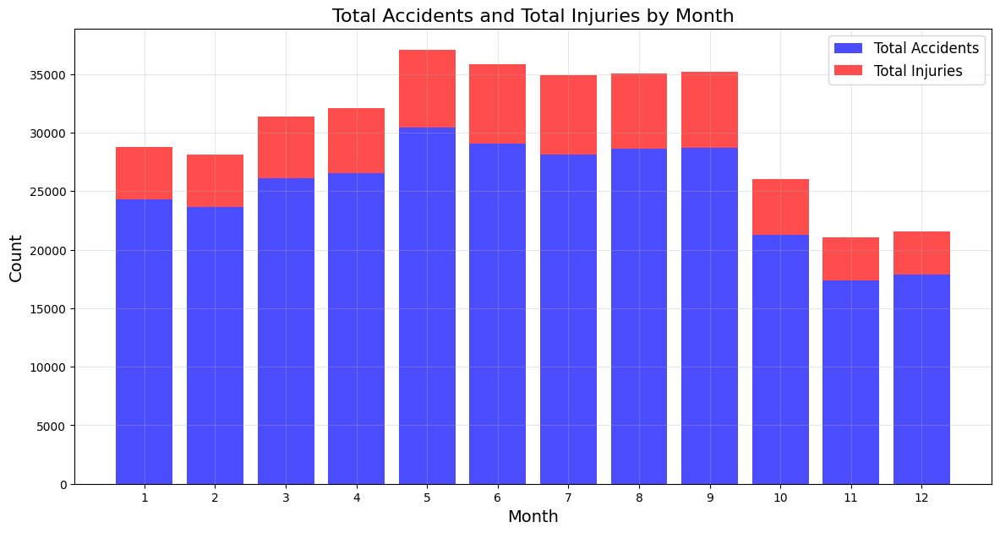

In [49]:
monthly_data = crashes.groupby('crash_month').agg({
    'injuries_total': 'sum',
    'crash_record_id': 'count'
}).rename(columns={'crash_record_id': 'total_accidents'})

# Plot
plt.figure(figsize=(14, 7))
plt.bar(monthly_data.index, monthly_data['total_accidents'], label='Total Accidents', color='blue', alpha=0.7)
plt.bar(monthly_data.index, monthly_data['injuries_total'], label='Total Injuries', color='red', alpha=0.7, bottom=monthly_data['total_accidents'])
plt.title('Total Accidents and Total Injuries by Month', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(range(1, 13))
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

# (Consider) Total Accidents and Total Injuries by Hour of the Day

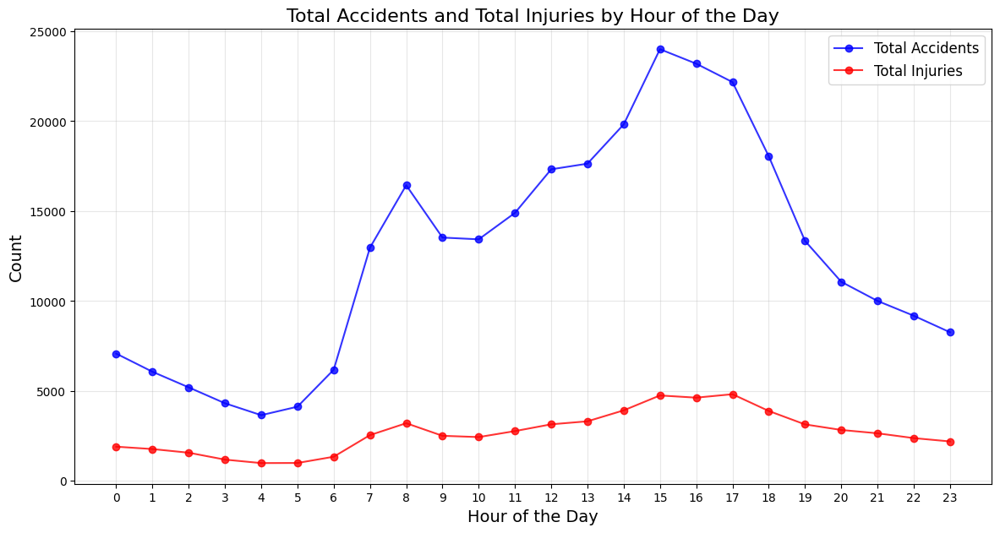

In [50]:
# Group by crash hour
hourly_data = crashes.groupby('crash_hour').agg({
    'injuries_total': 'sum',
    'crash_record_id': 'count'
}).rename(columns={'crash_record_id': 'total_accidents'})

plt.figure(figsize=(14, 7))
plt.plot(hourly_data.index, hourly_data['total_accidents'], label='Total Accidents', color='blue', marker='o', alpha=0.8)
plt.plot(hourly_data.index, hourly_data['injuries_total'], label='Total Injuries', color='red', marker='o', alpha=0.8)

plt.title('Total Accidents and Total Injuries by Hour of the Day', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(range(0, 24))  # Ensure all 24 hours are shown
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

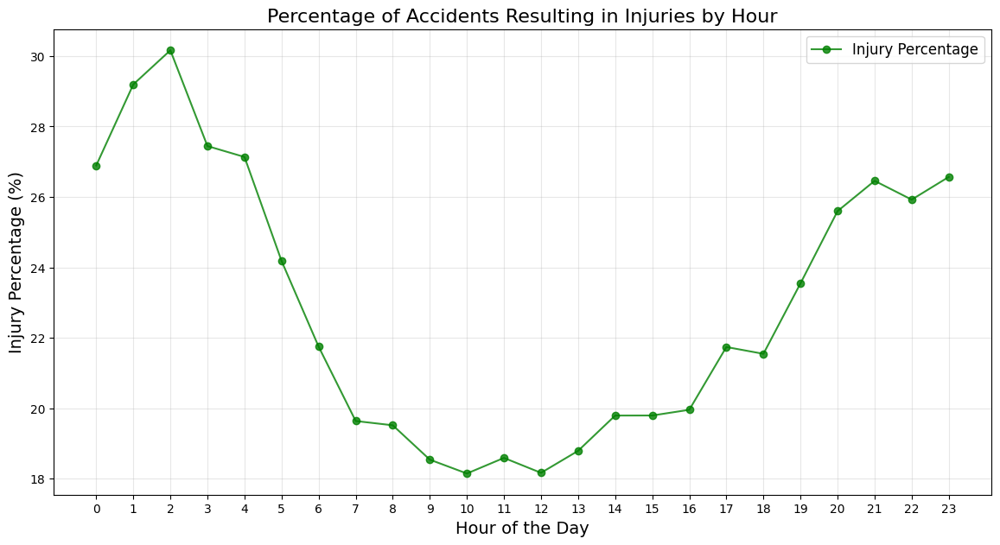

In [51]:
# Calculate injury percentage
hourly_data['injury_percentage'] = (hourly_data['injuries_total'] / hourly_data['total_accidents']) * 100

# Plot injury percentage
plt.figure(figsize=(14, 7))
plt.plot(hourly_data.index, hourly_data['injury_percentage'], label='Injury Percentage', color='green', marker='o', alpha=0.8)

plt.title('Percentage of Accidents Resulting in Injuries by Hour', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Injury Percentage (%)', fontsize=14)
plt.xticks(range(0, 24))  # Ensure all 24 hours are shown
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

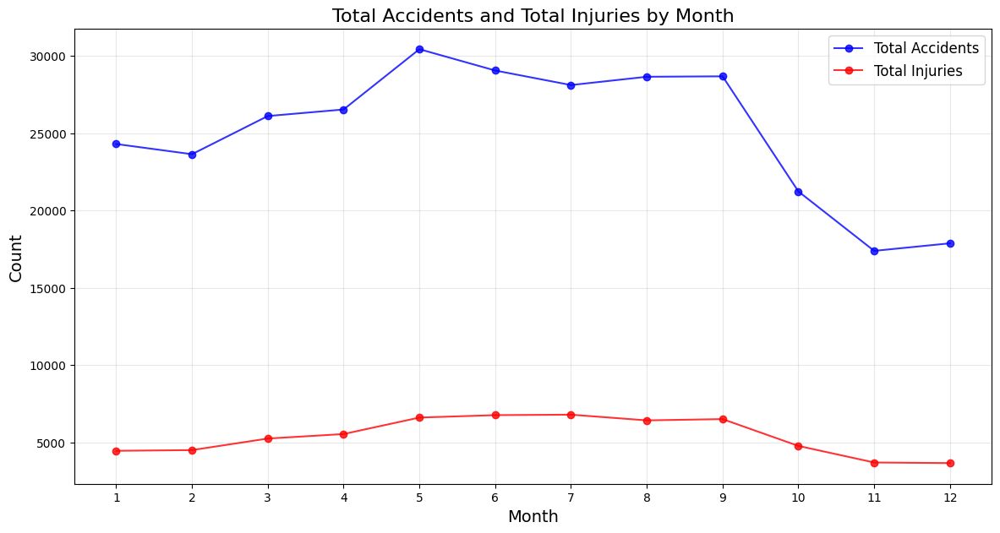

In [52]:
# Group by month
monthly_data = crashes.groupby('crash_month').agg({
    'injuries_total': 'sum',
    'crash_record_id': 'count'
}).rename(columns={'crash_record_id': 'total_accidents'})

# Plot using separate lines
plt.figure(figsize=(14, 7))
plt.plot(monthly_data.index, monthly_data['total_accidents'], label='Total Accidents', color='blue', marker='o', alpha=0.8)
plt.plot(monthly_data.index, monthly_data['injuries_total'], label='Total Injuries', color='red', marker='o', alpha=0.8)

plt.title('Total Accidents and Total Injuries by Month', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(range(1, 13))  # Ensure all 12 months are shown
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

# (Consider) Injuries by Gender

<Figure size 1400x700 with 0 Axes>

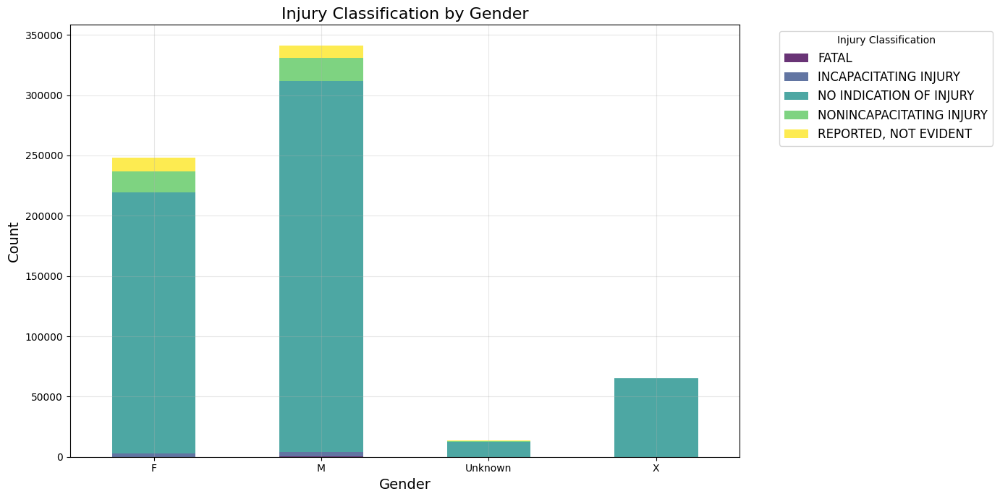

In [53]:
# Group by gender and injury classification
gender_injury_data = people.groupby(['sex', 'injury_classification']).size().unstack()

# Plot
plt.figure(figsize=(14, 7))
gender_injury_data.plot(kind='bar', stacked=True, colormap='viridis', alpha=0.8, figsize=(14, 7))
plt.title('Injury Classification by Gender', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Injury Classification', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# (Consider) Top 10 Primary Contributing Causes

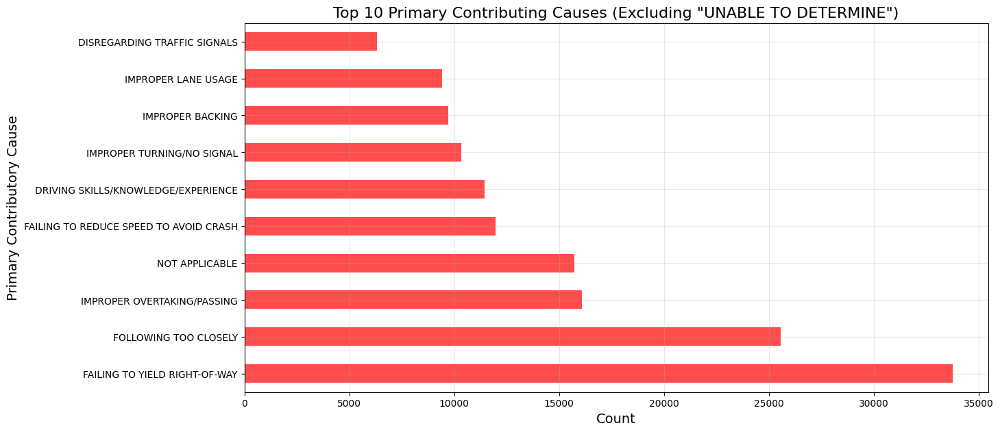

In [54]:
# Filter out 'UNABLE TO DETERMINE'
filtered_crashes = crashes[crashes['prim_contributory_cause'] != 'UNABLE TO DETERMINE']

# Group by primary contributory cause
contributory_data = filtered_crashes['prim_contributory_cause'].value_counts().head(10)

# Plot
plt.figure(figsize=(14, 7))
contributory_data.plot(kind='barh', color='red', alpha=0.7)  # Use horizontal bar chart
plt.title('Top 10 Primary Contributing Causes (Excluding "UNABLE TO DETERMINE")', fontsize=16)
plt.xlabel('Count', fontsize=14)  # Swap labels since the axes are flipped
plt.ylabel('Primary Contributory Cause', fontsize=14)
plt.grid(alpha=0.3)
plt.show()

# (Consider) 'Total Accidents, Injuries, and Fatal Injuries by Month and Year (Excluding Oct 2024)

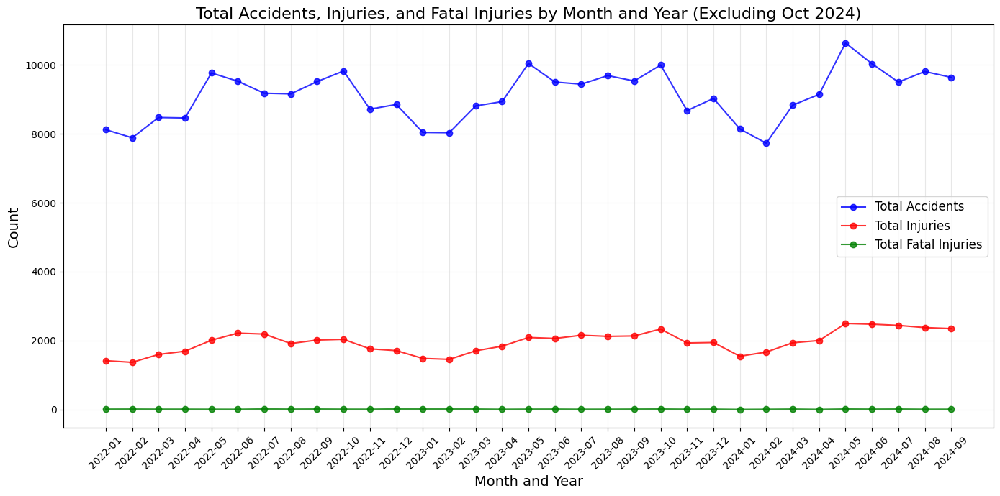

In [55]:
crashes['crash_date'] = pd.to_datetime(crashes['crash_date'])

# Extract year and month
crashes['year'] = crashes['crash_date'].dt.year
crashes['month'] = crashes['crash_date'].dt.month

# Exclude October 2024
crashes_filtered = crashes[~((crashes['year'] == 2024) & (crashes['month'] == 10))]

# Group by year and month
monthly_data = crashes_filtered.groupby(['year', 'month']).agg({
    'crash_record_id': 'count',  # Total accidents
    'injuries_total': 'sum',    # Total injuries
    'injuries_fatal': 'sum'     # Total fatal injuries
}).rename(columns={'crash_record_id': 'total_accidents'}).reset_index()

# Create a multi-line plot
plt.figure(figsize=(14, 7))

# Plot total accidents
plt.plot(
    monthly_data['month'] + (monthly_data['year'] - monthly_data['year'].min()) * 12,
    monthly_data['total_accidents'], label='Total Accidents', marker='o', color='blue', alpha=0.8
)

# Plot total injuries
plt.plot(
    monthly_data['month'] + (monthly_data['year'] - monthly_data['year'].min()) * 12,
    monthly_data['injuries_total'], label='Total Injuries', marker='o', color='red', alpha=0.8
)

# Plot total fatal injuries
plt.plot(
    monthly_data['month'] + (monthly_data['year'] - monthly_data['year'].min()) * 12,
    monthly_data['injuries_fatal'], label='Total Fatal Injuries', marker='o', color='green', alpha=0.8
)

# Customize plot
plt.title('Total Accidents, Injuries, and Fatal Injuries by Month and Year (Excluding Oct 2024)', fontsize=16)
plt.xlabel('Month and Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(
    ticks=monthly_data['month'] + (monthly_data['year'] - monthly_data['year'].min()) * 12,
    labels=[f"{year}-{month:02d}" for year, month in zip(monthly_data['year'], monthly_data['month'])],
    rotation=45
)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# (Consider) Distribution of Crashes by First Crash Type (Grouped Below 3% into Others)

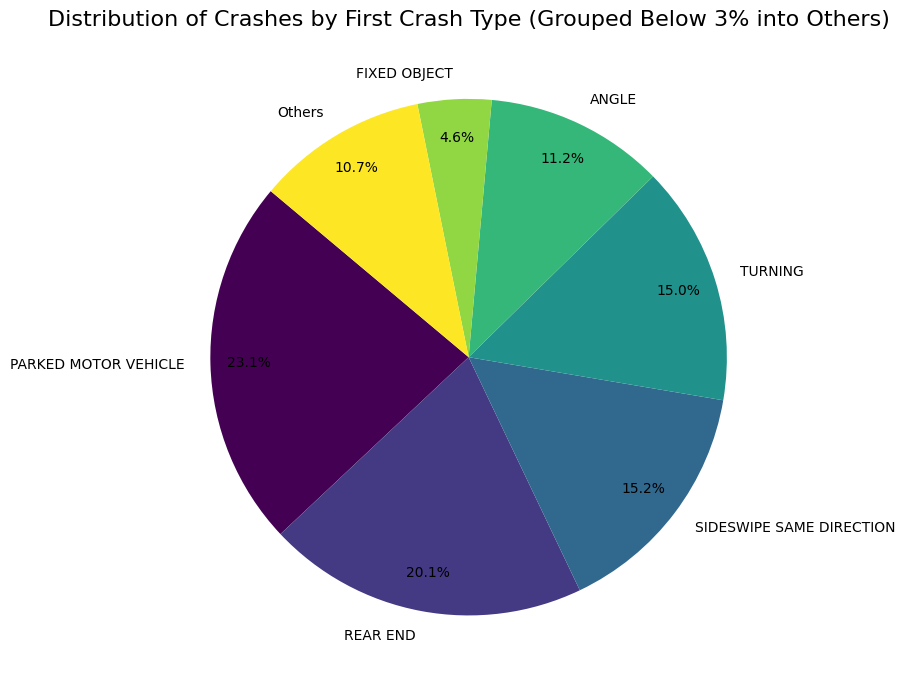

In [56]:
# Calculate value counts and percentages
first_crash_type_data = crashes['first_crash_type'].value_counts()
total_crashes = first_crash_type_data.sum()
first_crash_type_percentages = (first_crash_type_data / total_crashes) * 100

# Separate categories with percentages >= 3% and group others
threshold = 3
categories_above_threshold = first_crash_type_percentages[first_crash_type_percentages >= threshold]
categories_below_threshold = first_crash_type_percentages[first_crash_type_percentages < threshold]

# Combine categories into "Others"
categories_below_threshold_sum = pd.Series(categories_below_threshold.sum(), index=['Others'])
grouped_data = pd.concat([categories_above_threshold, categories_below_threshold_sum])

# Plot Pie Chart
plt.figure(figsize=(10, 7))
grouped_data.plot(kind='pie', autopct='%1.1f%%', startangle=140, colormap='viridis', pctdistance=0.85)
plt.title('Distribution of Crashes by First Crash Type (Grouped Below 3% into Others)', fontsize=16)
plt.ylabel('')  # Remove y-axis label for better aesthetics
plt.tight_layout()
plt.show()

# (Consider) Time-Based Distribution of Accidents and Injuries (Weekdays vs Weekends)

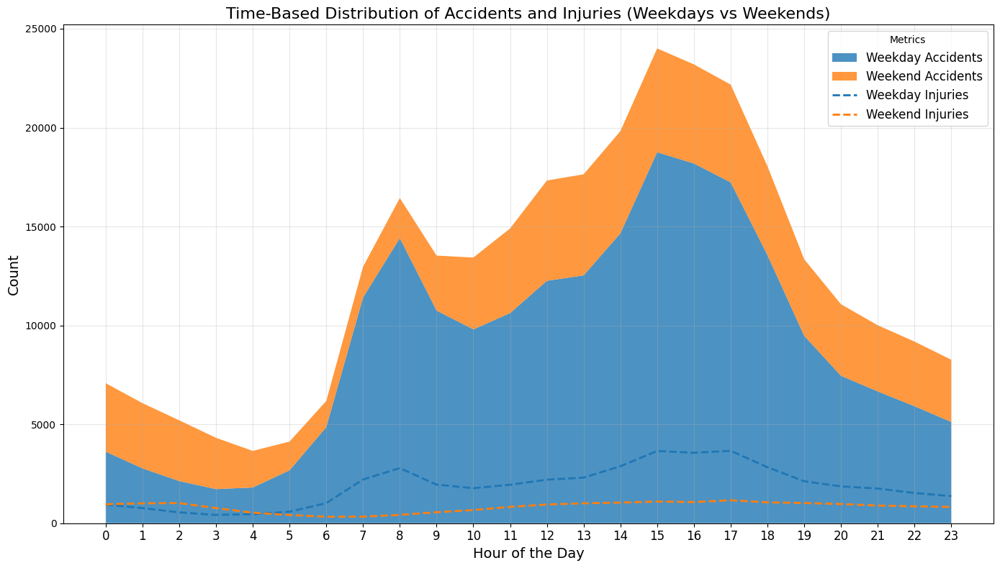

In [57]:
# Ensure crash_date is a datetime object
crashes['crash_date'] = pd.to_datetime(crashes['crash_date'])

# Classify as weekday or weekend
crashes['is_weekend'] = crashes['crash_date'].dt.dayofweek.isin([5, 6])  # 5=Saturday, 6=Sunday

# Group by hour and weekday/weekend, calculate accidents and injuries
hourly_data = crashes.groupby(['crash_hour', 'is_weekend']).agg({
    'crash_record_id': 'count',  # Number of accidents
    'injuries_total': 'sum'     # Total injuries
}).reset_index()

# Pivot data for accidents and injuries
hourly_accidents = hourly_data.pivot(index='crash_hour', columns='is_weekend', values='crash_record_id').fillna(0)
hourly_injuries = hourly_data.pivot(index='crash_hour', columns='is_weekend', values='injuries_total').fillna(0)

# Rename columns for clarity
hourly_accidents.columns = ['Weekday Accidents', 'Weekend Accidents']
hourly_injuries.columns = ['Weekday Injuries', 'Weekend Injuries']

# Plot the area chart
plt.figure(figsize=(14, 8))

# Plot accidents
plt.stackplot(hourly_accidents.index, 
              hourly_accidents['Weekday Accidents'], 
              hourly_accidents['Weekend Accidents'], 
              labels=['Weekday Accidents', 'Weekend Accidents'], 
              alpha=0.8, colors=['#1f77b4', '#ff7f0e'])

# Overlay injuries as line plots
plt.plot(hourly_injuries.index, hourly_injuries['Weekday Injuries'], label='Weekday Injuries', color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(hourly_injuries.index, hourly_injuries['Weekend Injuries'], label='Weekend Injuries', color='#ff7f0e', linestyle='--', linewidth=2)

# Customize the plot
plt.title('Time-Based Distribution of Accidents and Injuries (Weekdays vs Weekends)', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Metrics', fontsize=12)
plt.grid(alpha=0.3)
plt.xticks(range(0, 24), fontsize=12)
plt.tight_layout()
plt.show()

/tmp/ipykernel_17/1210695855.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  demographics_injury_data = people.groupby(['age_group', 'sex'])['injury_classification'].size().unstack().fillna(0)


<Figure size 1400x700 with 0 Axes>

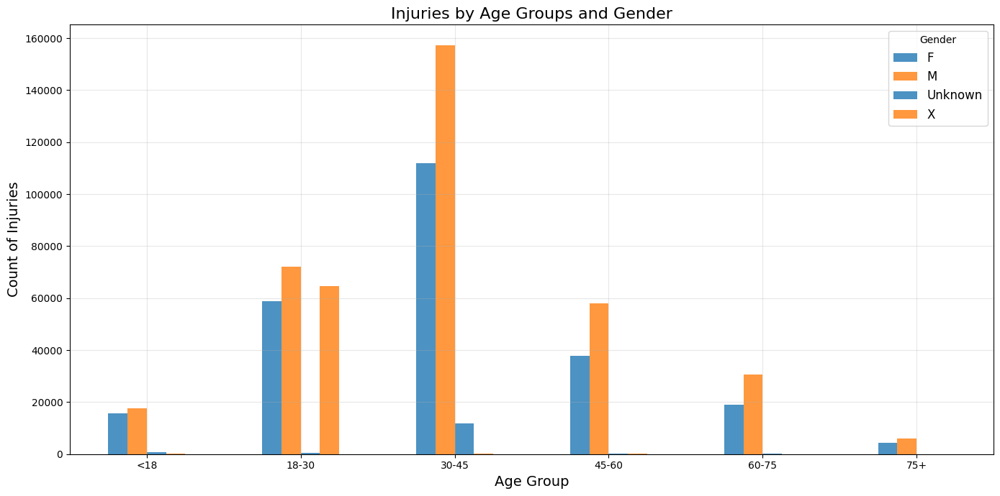

/tmp/ipykernel_17/1210695855.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_group_injury_counts = people.groupby('age_group')['injury_classification'].size()


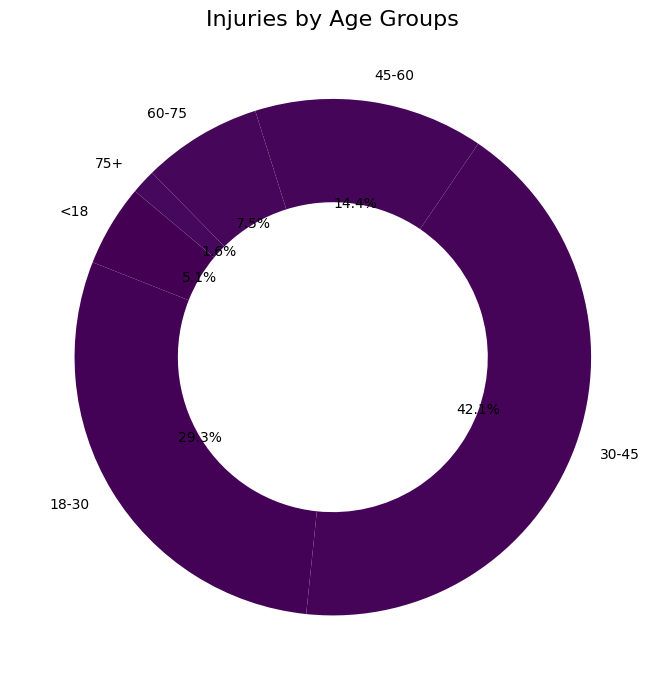

In [58]:
# 1. Create age groups
bins = [0, 18, 30, 45, 60, 75, 100]  # Define age bins
labels = ['<18', '18-30', '30-45', '45-60', '60-75', '75+']
people['age_group'] = pd.cut(people['age'], bins=bins, labels=labels, right=False)

# 2. Group data by age group and gender
demographics_injury_data = people.groupby(['age_group', 'sex'])['injury_classification'].size().unstack().fillna(0)

# Clustered Bar Chart: Injuries by Age Groups and Gender
plt.figure(figsize=(14, 7))
demographics_injury_data.plot(kind='bar', figsize=(14, 7), alpha=0.8, color=['#1f77b4', '#ff7f0e'])
plt.title('Injuries by Age Groups and Gender', fontsize=16)
plt.xlabel('Age Group', fontsize=14)
plt.ylabel('Count of Injuries', fontsize=14)
plt.legend(title='Gender', fontsize=12)
plt.grid(alpha=0.3)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# 3. Total injuries by age group for the doughnut chart
age_group_injury_counts = people.groupby('age_group')['injury_classification'].size()

# Doughnut Chart: Proportion of Injuries by Age Group
plt.figure(figsize=(10, 7))
plt.pie(
    age_group_injury_counts,
    labels=age_group_injury_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.cm.viridis.colors[:len(age_group_injury_counts)],
    wedgeprops={'width': 0.4}  # Create doughnut effect
)
plt.title('Injuries by Age Groups', fontsize=16)
plt.tight_layout()
plt.show()

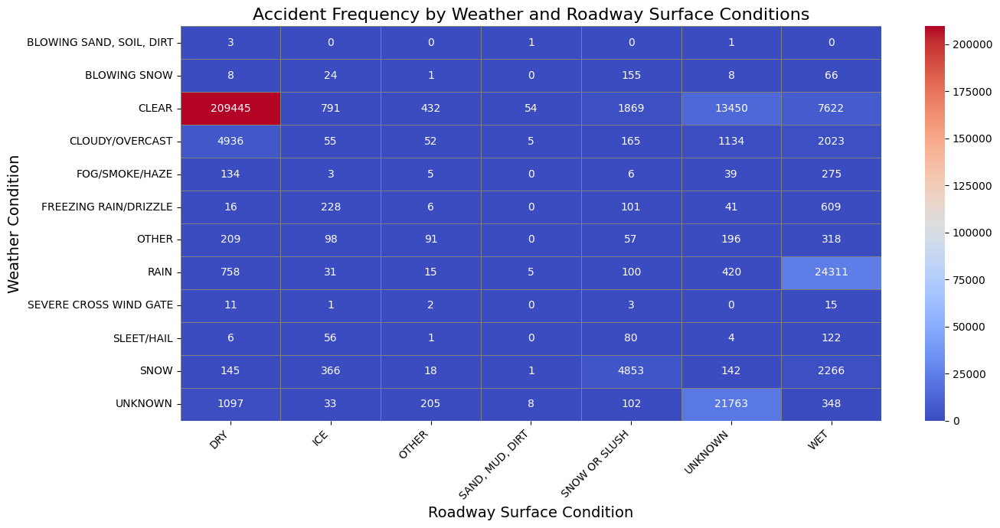

In [59]:
# Aggregate data to calculate accident frequency for each combination of conditions
condition_data = crashes.groupby(['weather_condition', 'roadway_surface_cond', 'lighting_condition']).size().reset_index(name='accident_count')

# Pivot the data to create a heatmap-ready DataFrame
heatmap_data = condition_data.pivot_table(
    index='weather_condition', 
    columns='roadway_surface_cond', 
    values='accident_count', 
    aggfunc='sum'
).fillna(0)  # Replace NaN with 0 for visualization

# Create the heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(
    heatmap_data, 
    annot=True, 
    fmt='.0f', 
    cmap='coolwarm', 
    linewidths=0.5, 
    linecolor='gray'
)

# Customize plot
plt.title('Accident Frequency by Weather and Roadway Surface Conditions', fontsize=16)
plt.xlabel('Roadway Surface Condition', fontsize=14)
plt.ylabel('Weather Condition', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

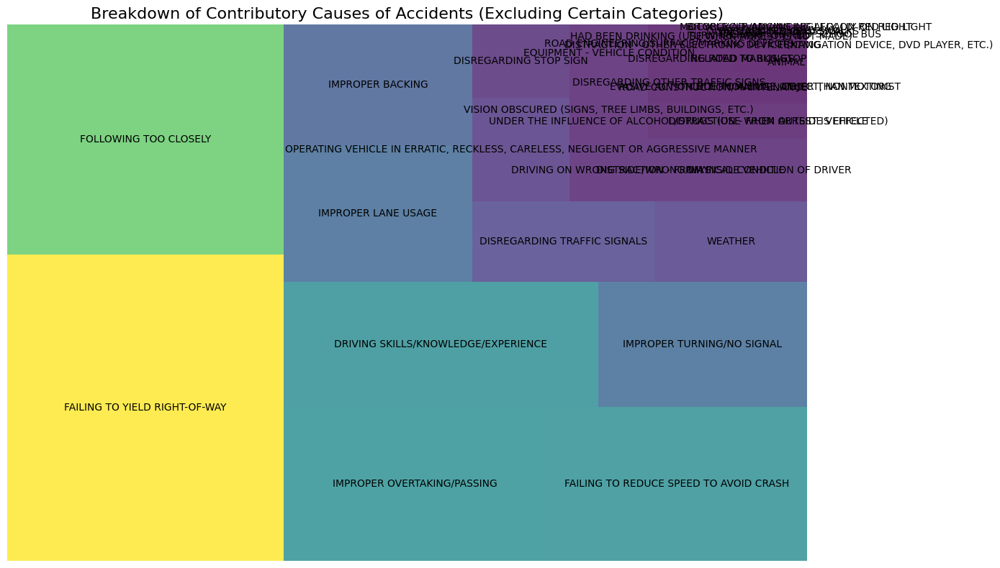

In [60]:
import squarify  # Treemap plotting library

# Combine primary and secondary contributory causes into a single dataset
contributory_factors = crashes['prim_contributory_cause'].value_counts().add(
    crashes['sec_contributory_cause'].value_counts(), fill_value=0
).reset_index()
contributory_factors.columns = ['Contributory Cause', 'Accident Count']

# Exclude 'NOT APPLICABLE' and 'UNABLE TO DETERMINE'
excluded_categories = ['NOT APPLICABLE', 'UNABLE TO DETERMINE']
contributory_factors = contributory_factors[~contributory_factors['Contributory Cause'].isin(excluded_categories)]

# Sort the data by accident count
contributory_factors = contributory_factors.sort_values(by='Accident Count', ascending=False)

# Create the treemap
plt.figure(figsize=(14, 8))
squarify.plot(
    sizes=contributory_factors['Accident Count'], 
    label=contributory_factors['Contributory Cause'], 
    color=plt.cm.viridis(contributory_factors['Accident Count'] / contributory_factors['Accident Count'].max()), 
    alpha=0.8
)

# Customize the plot
plt.title('Breakdown of Contributory Causes of Accidents (Excluding Certain Categories)', fontsize=16)
plt.axis('off')  # Turn off axis
plt.tight_layout()
plt.show()

# (Consider those two) 'Breakdown of Top Contributory Causes of Accidents (Grouped)

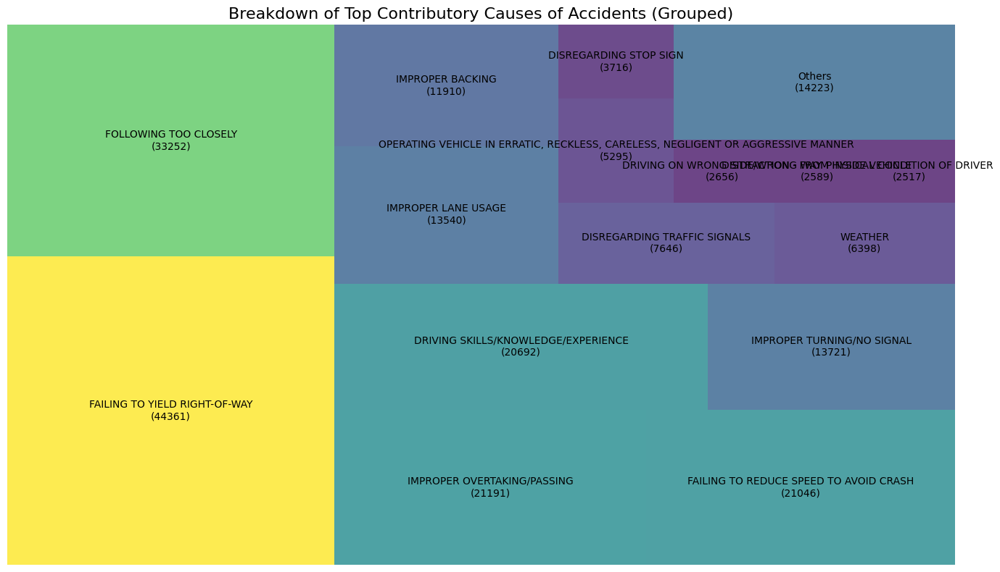

In [61]:
import squarify  # Treemap plotting library
import matplotlib.pyplot as plt
import pandas as pd

# Combine primary and secondary contributory causes into a single dataset
contributory_factors = crashes['prim_contributory_cause'].value_counts().add(
    crashes['sec_contributory_cause'].value_counts(), fill_value=0
).reset_index()
contributory_factors.columns = ['Contributory Cause', 'Accident Count']

# Exclude 'NOT APPLICABLE' and 'UNABLE TO DETERMINE'
excluded_categories = ['NOT APPLICABLE', 'UNABLE TO DETERMINE']
contributory_factors = contributory_factors[~contributory_factors['Contributory Cause'].isin(excluded_categories)]

# Sort the data by accident count
contributory_factors = contributory_factors.sort_values(by='Accident Count', ascending=False)

# Limit to top 15 categories, group the rest as "Others"
top_n = 15
top_categories = contributory_factors.iloc[:top_n]
others_count = contributory_factors.iloc[top_n:]['Accident Count'].sum()
others_row = pd.DataFrame({'Contributory Cause': ['Others'], 'Accident Count': [others_count]})
top_categories = pd.concat([top_categories, others_row], ignore_index=True)

# Create the treemap
plt.figure(figsize=(14, 8))
squarify.plot(
    sizes=top_categories['Accident Count'], 
    label=[f"{cause}\n({count})" for cause, count in zip(top_categories['Contributory Cause'], top_categories['Accident Count'])], 
    color=plt.cm.viridis(top_categories['Accident Count'] / top_categories['Accident Count'].max()), 
    alpha=0.8
)

# Customize the plot
plt.title('Breakdown of Top Contributory Causes of Accidents (Grouped)', fontsize=16)
plt.axis('off')  # Turn off axis
plt.tight_layout()
plt.show()

# (Consider those two) Top Contributory Causes of Accidents (Including Others)

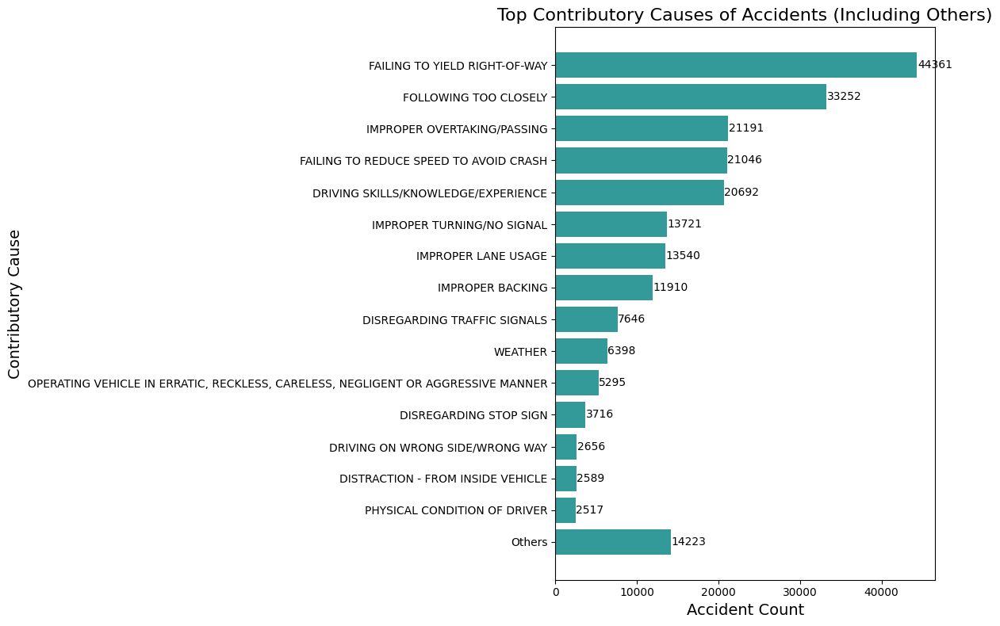

In [62]:
# Combine primary and secondary contributory causes into a single dataset
contributory_factors = crashes['prim_contributory_cause'].value_counts().add(
    crashes['sec_contributory_cause'].value_counts(), fill_value=0
).reset_index()
contributory_factors.columns = ['Contributory Cause', 'Accident Count']

# Exclude 'NOT APPLICABLE' and 'UNABLE TO DETERMINE'
excluded_categories = ['NOT APPLICABLE', 'UNABLE TO DETERMINE']
contributory_factors = contributory_factors[~contributory_factors['Contributory Cause'].isin(excluded_categories)]

# Sort the data by accident count
contributory_factors = contributory_factors.sort_values(by='Accident Count', ascending=False)

# Limit to top 15 categories, group the rest as "Others"
top_n = 15
top_categories = contributory_factors.iloc[:top_n]
others_count = contributory_factors.iloc[top_n:]['Accident Count'].sum()
others_row = pd.DataFrame({'Contributory Cause': ['Others'], 'Accident Count': [others_count]})
top_categories = pd.concat([top_categories, others_row], ignore_index=True)

# Plot a horizontal bar chart
plt.figure(figsize=(12, 8))
plt.barh(top_categories['Contributory Cause'], top_categories['Accident Count'], color='teal', alpha=0.8)
plt.gca().invert_yaxis()  # Invert y-axis to have the highest category on top

# Add data labels
for index, value in enumerate(top_categories['Accident Count']):
    plt.text(value + 50, index, str(int(value)), va='center', fontsize=10)

# Customize the plot
plt.title('Top Contributory Causes of Accidents (Including Others)', fontsize=16)
plt.xlabel('Accident Count', fontsize=14)
plt.ylabel('Contributory Cause', fontsize=14)
plt.tight_layout()

# Show plot
plt.show()

<Figure size 1400x700 with 0 Axes>

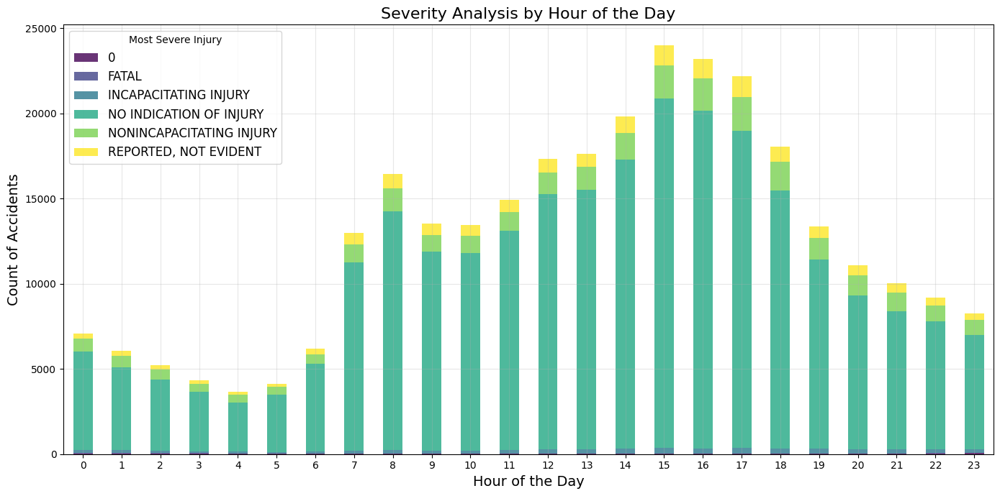

In [63]:
severity_by_hour = crashes.groupby(['crash_hour', 'most_severe_injury']).size().unstack().fillna(0)

# Plot stacked bar chart for severity by time of day
plt.figure(figsize=(14, 7))
severity_by_hour.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis', alpha=0.8)
plt.title('Severity Analysis by Hour of the Day', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Count of Accidents', fontsize=14)
plt.legend(title='Most Severe Injury', fontsize=12)
plt.grid(alpha=0.3)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

<Figure size 1400x700 with 0 Axes>

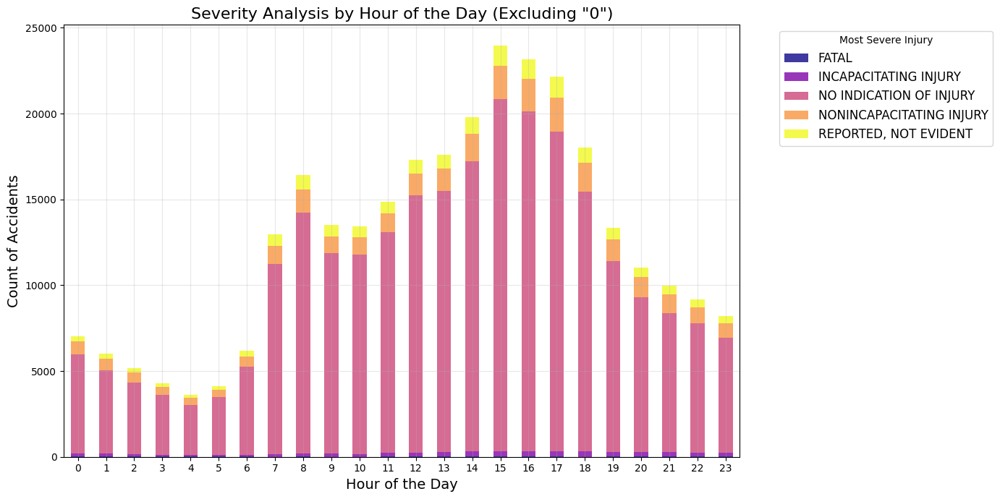

In [64]:
# Group by hour and most severe injury
severity_by_hour = crashes.groupby(['crash_hour', 'most_severe_injury']).size().unstack().fillna(0)

# Filter out the "0" category
severity_by_hour = severity_by_hour.drop(columns=['0'], errors='ignore')

# Plot stacked bar chart for severity by time of day
plt.figure(figsize=(14, 7))
severity_by_hour.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='plasma', alpha=0.8)

# Customize plot
plt.title('Severity Analysis by Hour of the Day (Excluding "0")', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Count of Accidents', fontsize=14)
plt.legend(title='Most Severe Injury', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.xticks(rotation=0)
plt.tight_layout()

# Show plot
plt.show()

<Figure size 1400x700 with 0 Axes>

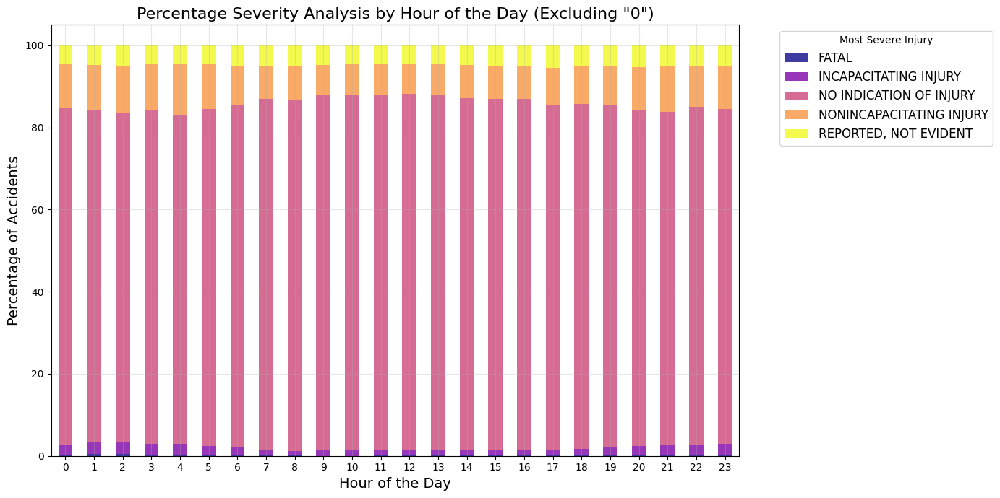

In [65]:
# Group by hour and most severe injury
severity_by_hour = crashes.groupby(['crash_hour', 'most_severe_injury']).size().unstack().fillna(0)

# Filter out the "0" category
severity_by_hour = severity_by_hour.drop(columns=['0'], errors='ignore')

# Normalize each row to show percentages
severity_by_hour_percentage = severity_by_hour.div(severity_by_hour.sum(axis=1), axis=0) * 100

# Plot stacked bar chart for percentage analysis
plt.figure(figsize=(14, 7))
severity_by_hour_percentage.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='plasma', alpha=0.8)

# Customize plot
plt.title('Percentage Severity Analysis by Hour of the Day (Excluding "0")', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Percentage of Accidents', fontsize=14)
plt.legend(title='Most Severe Injury', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.xticks(rotation=0)
plt.tight_layout()

# Show plot
plt.show()